![](https://github.com/gitflai/imagens/blob/main/Slide1.JPG?raw=true)

# **Dados de Custos Médicos** | *Medical Cost Data*

Os dados são provenientes da plataforma Kaggle e pode ser acessado nesse [link](https://www.kaggle.com/mirichoi0218/insurance). 

As variáveis desse dataset são: 
- *age*: idade da pessoa.
- *sex*: gênero da pessoa.
- *bmi*: índice de massa corporal da pessoa.
- *children*: número de dependentes da pessoa.
- *smoker*: se a pessoa é fumante ou não
- *region*: região em que a pessoa mora.
- *charges*: custos médicos individuais cobrados pelo plano de saúde

O objetivo primário nesse dataset é fazer a previsão da variável custos. Fazer essa previsão é fundamental e de interesse de qualquer instituição que venda planos de saúde. Fazer essa precificação corretamente é fundamental para adquirir uma vantagem competitiva no mercado. Uma boa precificação garante que a instituição está operando dentro dos limites orçamentários e que cada pessoa pague o mais próximo do que seria uma parcela justa, de acordo com suas variáveis de entrada. 

E os objetivos desse case são:
- Ilustrar os recursos do PyCaret 
- Criar uma solução rápida e com boa performance. 
- Explorar os contextos de regressão e classificação. 
- Mostrar que é possível colocar uma nova ótica em conjuntos clássicos da literatura. 
- Procedimento end-to-end de Machine Learning: dos dados ao deploy. 

Um possíve objetivo secundário seria fazer um modelo para previsão da variável *fumante* para detectar possíveis fraudadores dessa variável. Como é uma variável que impacta significativamente no preço dos planos de saúde, algumas pessoas podem se ver tentadas a responderem que não são fumantes, quando na verdade são. Isso levaria a precificações incorretas e injustas. Para resolver isso, um modelo pode ser empregado e indicar a probabilidade de um indivídio estar comentendo fraude. Os indivíduos com maior probabilidade de fraude podem seguir para uma investigação mais detalhada do caso, de modo a evitar perdas maiores. 

O outline desse case:

- Análise Exploratória de Dados (Rápida).
- Machine Learning com PyCaret | Objetivo primário: case de regressão.
- Machine Learning com PyCaret | Objetivo secundário: case de classificação.
- Considerações Finais.

---

In [1]:
#Importação de Bibliotecas
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling as pp
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff


import IPython

%matplotlib inline

import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

In [2]:
 #Importing dataset
from pycaret.datasets import get_data
dados = get_data('insurance')

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [3]:
#fonte = "insurance.csv"
#dados = pd.read_csv(fonte, sep=",", low_memory="False")

# Informações básicas
print(f'Registros: {len(dados)}\nVariáveis: {len(dados.columns)}')

# Mostrar todas as colunas da base:
pd.set_option('display.max_columns', None)

Registros: 1338
Variáveis: 7


In [4]:
# Vendo os Primeiros Registros
dados.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


### **EDA automática através do PandasProfiling**

In [5]:
pp.ProfileReport(dados)

### **EDA automática através do SweetViz**

In [6]:
import sweetviz 

In [7]:
eda = sweetviz.analyze(dados)
eda.show_html(filepath = 'Relatorio_Univariado.html') 


Report Relatorio_Univariado.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [8]:
eda2 = sweetviz.compare_intra(dados, dados['smoker'] == 'yes', ['Fumante', 'Não Fumante'])
eda2.show_html(filepath = 'Relatorio_Bivariado.html') 


Report Relatorio_Bivariado.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


## EDA automática através do  D-Tale

In [9]:
import dtale

In [10]:
#Para visualização/edição apenas enquanto o processamento estiver ligado..
Relatorio1c = dtale.show(dados)
Relatorio1c

## EDA automática através do  Autoviz

In [11]:
from autoviz.AutoViz_Class import AutoViz_Class

Imported AutoViz_Class version: 0.0.81. Call using:
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 saves plots in your local machine under AutoViz_Plots directory and does not display charts.


In [12]:
AV = AutoViz_Class()

Shape of your Data Set: (1338, 7)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
Data Set Shape: 1338 rows, 6 cols
Data Set columns info:
* age: 0 nulls, 47 unique vals, most common: {18: 69, 19: 68}
* sex: 0 nulls, 2 unique vals, most common: {'male': 676, 'female': 662}
* bmi: 0 nulls, 548 unique vals, most common: {32.3: 13, 28.31: 9}
* children: 0 nulls, 6 unique vals, most common: {0: 574, 1: 324}
* smoker: 0 nulls, 2 unique vals, most common: {'no': 1064, 'yes': 274}
* region: 0 nulls, 4 unique vals, most common: {'southeast': 364, 'northwest': 325}
--------------------------------------------------------------------
    Numeric Columns: ['bmi']
    Integer-Categorical Columns: ['age', 'children']
    String-Categorical Columns: ['region']
    Factor-Categorical Columns: []
    String-Boolean Columns: ['sex', 'smoker']
    Numeric-Boolean Columns: []
    Discrete String Columns: []
    NLP text Columns: []
    Da

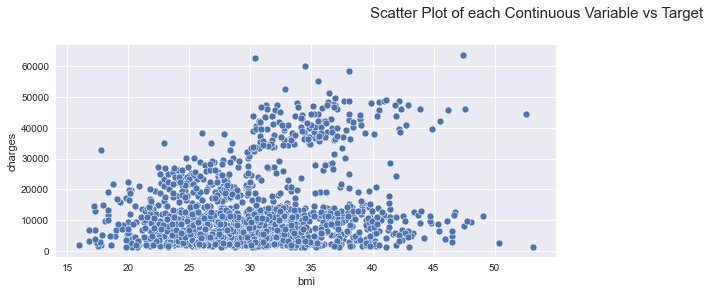

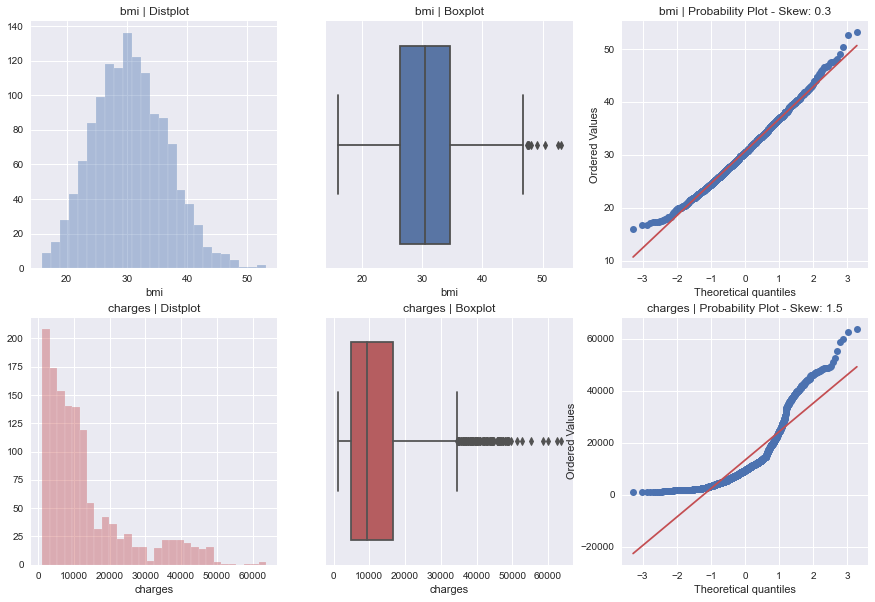

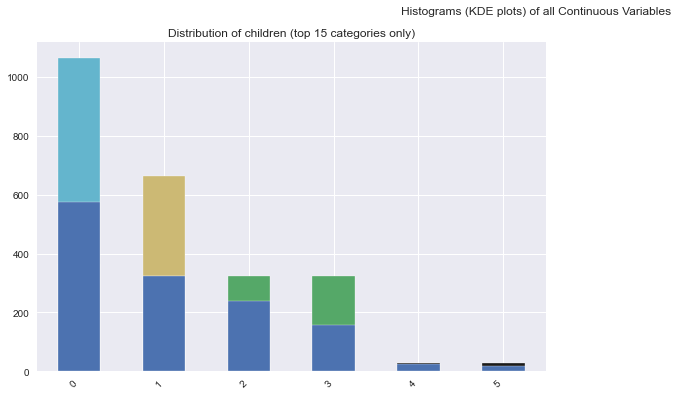

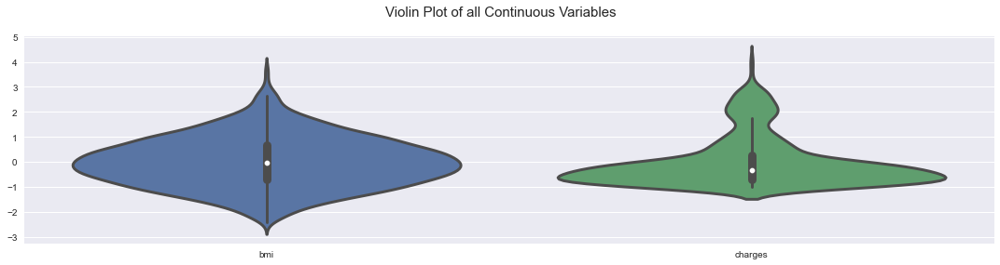

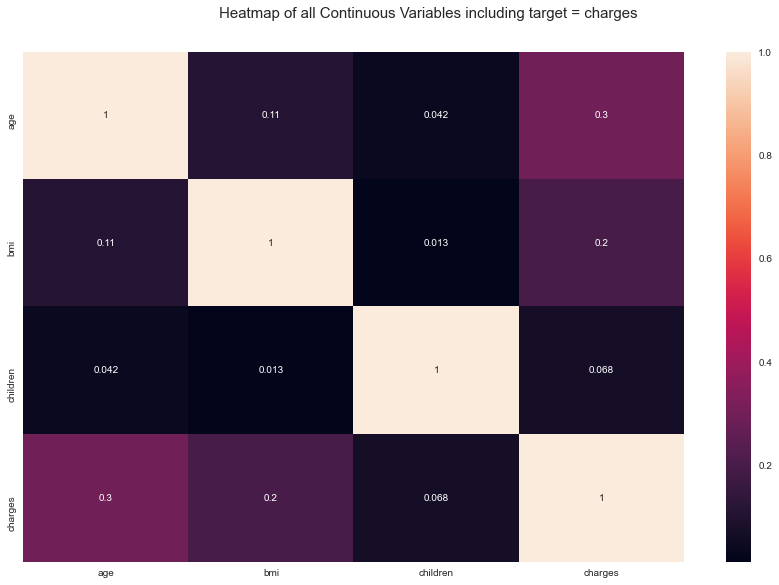

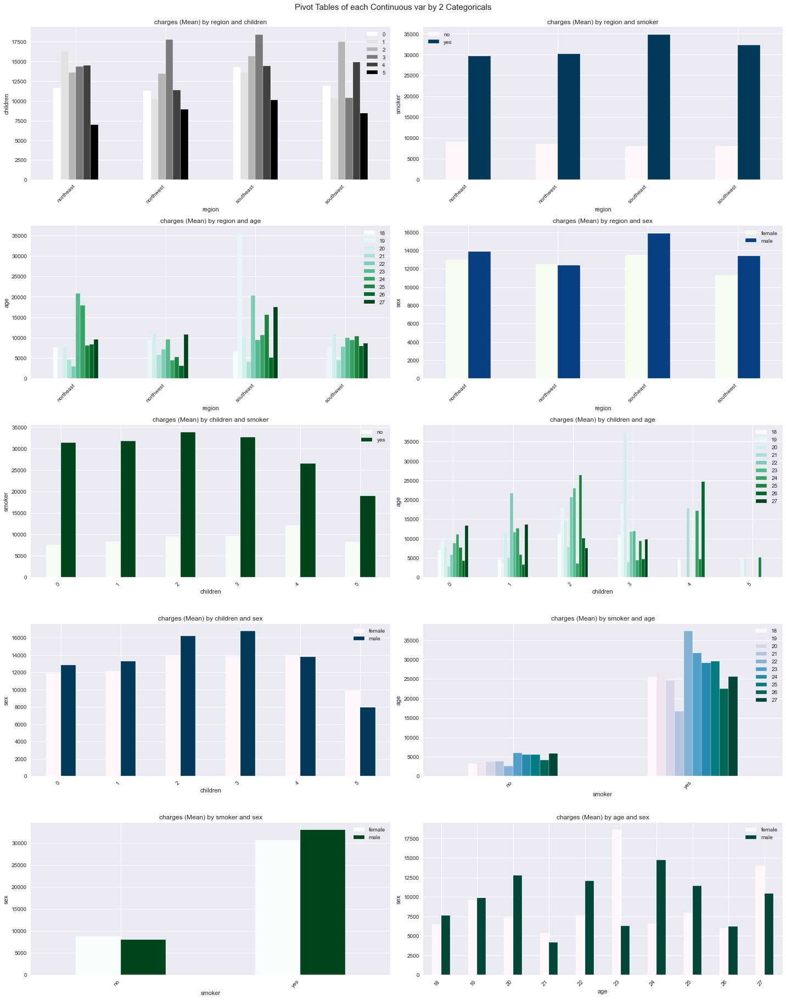

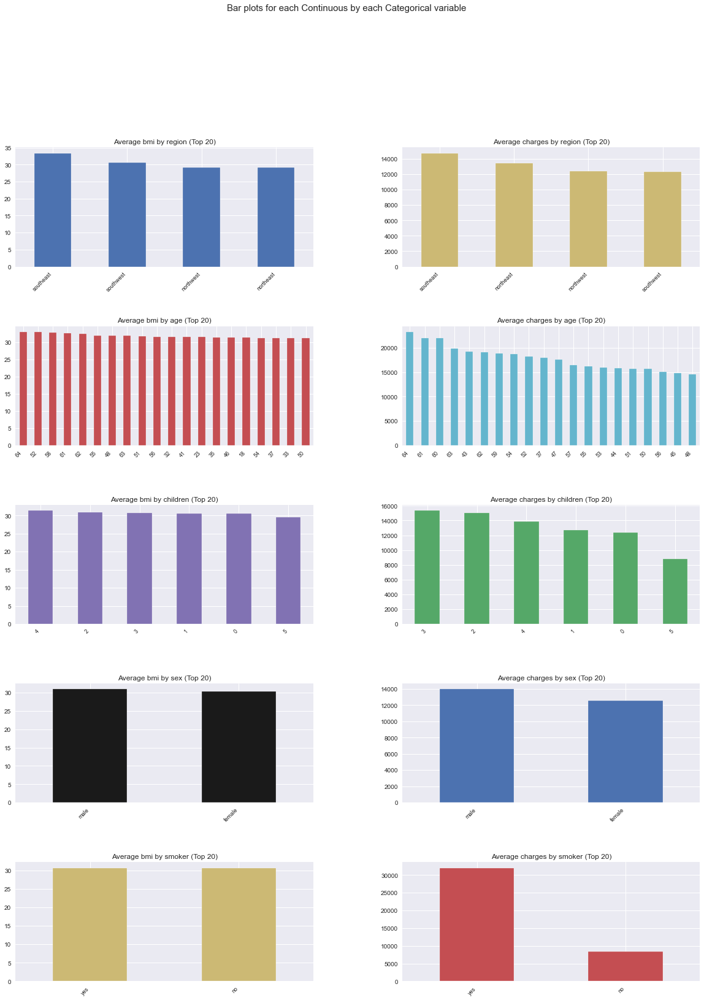

All Plots done
Time to run AutoViz (in seconds) = 12.162

 ###################### VISUALIZATION Completed ########################


In [13]:
sep = ','

dft = AV.AutoViz(filename="",sep=sep, depVar='charges', dfte=dados, header=0, verbose=2, lowess=False, chart_format='svg', max_rows_analyzed=150000, max_cols_analyzed=30) # salva em "AutoViz_Plots"
dft = AV.AutoViz(filename="",sep=sep, depVar='charges', dfte=dados, header=0, verbose=1, lowess=False, chart_format='svg', max_rows_analyzed=150000, max_cols_analyzed=30)

## **Machine Learning com PyCaret  |  Objetivo primário: obter um bom modelo para previsão dos custos para melhor precificação de planos de saúde** 

In [14]:
from pycaret.regression import *

In [15]:
# configurações de pré-processamento e validação nos modelos utilizados adiante. 

regressao = setup(data = dados, 
                  target = 'charges', 
                  normalize = True,
                  combine_rare_levels = True, 
                  remove_outliers = True,
                  session_id = 1)

,Description,Value
0,session_id,1
1,Target,charges
2,Original Data,"(1338, 7)"
3,Missing Values,False
4,Numeric Features,2
5,Categorical Features,4
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(889, 12)"


2021-01-01 15:31:53,337 - INFO     - create_model_container: 0
2021-01-01 15:31:53,338 - INFO     - master_model_container: 0
2021-01-01 15:31:53,339 - INFO     - display_container: 1
2021-01-01 15:31:53,351 - INFO     - Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='charges',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strategy...
                ('rem_outliers',
                 Outlier(contamination=0.05, methods=['pca'], random_st

## Criando um modelo incial básico, porém robusto, utilizando Random Forest.


In [16]:
# para verificar o que cada parâmetro faz:
?setup

In [17]:
models()

2021-01-01 15:31:54,523 - INFO     - gpu_param set to False


,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [18]:
floresta = create_model('rf')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,3065.8718,34106900.5546,5840.1113,0.7570,0.5776,0.2456
1,2942.7974,24532399.5580,4953.0192,0.8183,0.5449,0.3843
2,1887.0997,10723264.9138,3274.6397,0.8990,0.4367,0.4087
3,3451.8831,29887162.2822,5466.9152,0.7851,0.5286,0.4453
4,3129.8362,29041930.6027,5389.0566,0.7399,0.5266,0.3780
5,2444.9832,18585626.6520,4311.1050,0.8608,0.3952,0.2622
6,2873.0122,24373624.8903,4936.9651,0.8232,0.5056,0.3708
7,3048.1831,32006337.1023,5657.4143,0.7605,0.4838,0.3586
8,2703.9166,24346496.2037,4934.2169,0.8649,0.5006,0.3070
9,2991.1387,22848057.9162,4779.9642,0.8724,0.5506,0.5570


2021-01-01 15:32:02,252 - INFO     - create_model_container: 1
2021-01-01 15:32:02,253 - INFO     - master_model_container: 1
2021-01-01 15:32:02,254 - INFO     - display_container: 2
2021-01-01 15:32:02,256 - INFO     - RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=1, verbose=0, warm_start=False)
2021-01-01 15:32:02,257 - INFO     - create_model() succesfully completed......................................


In [19]:
# tunando a floresta através do método RandomSearch, isto é, explorando 20 alternativas diferentes de hiperparâmetros

floresta_tunada = tune_model(floresta, optimize = 'MAPE', n_iter = 20)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2696.4318,33297978.1369,5770.4400,0.7628,0.5702,0.1859
1,2059.5067,21663292.9784,4654.3843,0.8396,0.4584,0.1522
2,741.1999,5263038.8888,2294.1314,0.9504,0.1833,0.1074
3,2289.6780,23899379.9286,4888.6992,0.8281,0.4241,0.1961
4,2159.5583,25900002.9129,5089.2045,0.7680,0.4466,0.1532
5,1956.6747,19059303.3980,4365.6962,0.8572,0.3877,0.1323
6,1687.1545,16347426.5205,4043.1951,0.8814,0.3570,0.1429
7,2357.3341,32682019.1890,5716.8190,0.7554,0.4302,0.1489
8,1992.6189,26849852.8497,5181.6844,0.8510,0.5183,0.1357
9,1376.5790,13589800.3352,3686.4346,0.9241,0.2701,0.1264


2021-01-01 15:33:47,237 - INFO     - create_model_container: 2
2021-01-01 15:33:47,238 - INFO     - master_model_container: 2
2021-01-01 15:33:47,239 - INFO     - display_container: 3
2021-01-01 15:33:47,242 - INFO     - RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mae',
                      max_depth=5, max_features=1.0, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.05,
                      min_impurity_split=None, min_samples_leaf=4,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=10, n_jobs=-1, oob_score=False,
                      random_state=1, verbose=0, warm_start=False)
2021-01-01 15:33:47,243 - INFO     - tune_model() succesfully completed......................................


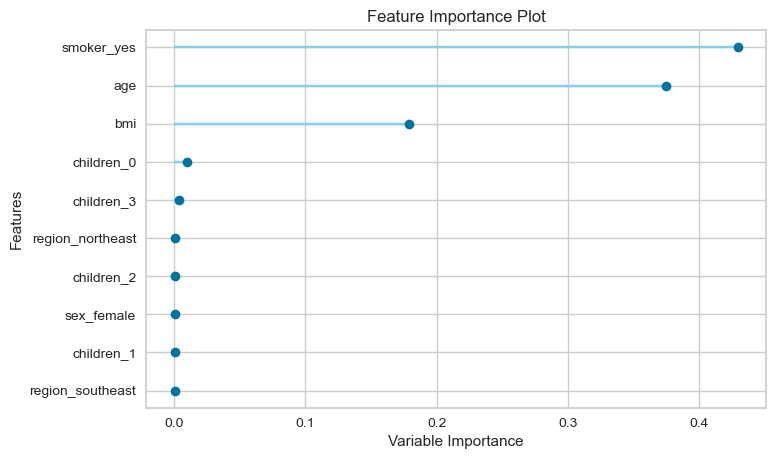

2021-01-01 15:33:47,976 - INFO     - Visual Rendered Successfully
2021-01-01 15:33:48,197 - INFO     - plot_model() succesfully completed......................................


In [20]:
# importancia das variáveis de acordo com a floresta tunada

plot_model(floresta_tunada, plot = 'feature')

## Avaliando os modelos disponíveis e selecionando os 3 melhores, em suas configurações padrão:


In [21]:
modelos = compare_models(sort = 'RMSLE', n_select = 3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,2618.5105,21939145.7054,4620.8009,0.8411,0.4538,0.3272,0.0540
huber,Huber Regressor,3265.7950,45653522.0460,6709.2974,0.6664,0.4712,0.2083,0.0260
par,Passive Aggressive Regressor,3336.9808,45462638.5117,6692.3543,0.6682,0.4780,0.2061,0.0500
catboost,CatBoost Regressor,2774.6317,23535840.5491,4804.2591,0.8287,0.4798,0.3448,1.5070
rf,Random Forest Regressor,2853.8722,25045180.0676,4954.3408,0.8181,0.5050,0.3717,0.2690
et,Extra Trees Regressor,2807.6434,28147467.2349,5262.9452,0.7960,0.5151,0.3584,0.2200
llar,Lasso Least Angle Regression,4073.6879,36195713.0800,5980.3382,0.7386,0.5516,0.4146,0.0170
br,Bayesian Ridge,4084.1088,36183583.7870,5978.8591,0.7388,0.5565,0.4161,0.0170
ridge,Ridge Regression,4090.1067,36183785.4000,5978.8551,0.7388,0.5570,0.4173,0.0150
lasso,Lasso Regression,4074.6996,36183385.8000,5978.9156,0.7387,0.5596,0.4143,0.0160


2021-01-01 15:34:27,400 - INFO     - create_model_container: 21
2021-01-01 15:34:27,402 - INFO     - master_model_container: 21
2021-01-01 15:34:27,403 - INFO     - display_container: 4
2021-01-01 15:34:27,406 - INFO     - [GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=1, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False), HuberRegressor(alpha=0.0001, epsilon=1.35, fit_intercept=True, max_iter=100,
               tol=1e-05, warm_star

In [22]:
modelos_tunados = [tune_model(i, optimize = 'RMSLE') for i in modelos]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,4196.8841,63067275.2800,7941.4907,0.5507,0.7010,0.2317
1,3750.8492,42738287.7476,6537.4527,0.6835,0.5233,0.2160
2,1887.5507,17920473.4844,4233.2580,0.8312,0.3077,0.1452
3,4000.3528,50590120.6951,7112.6732,0.6362,0.4549,0.2093
4,3267.9138,41074048.4538,6408.9038,0.6321,0.4605,0.1716
5,3627.7139,45519622.8629,6746.8232,0.6590,0.4259,0.1755
6,3414.5381,41750307.3974,6461.4478,0.6972,0.3936,0.1747
7,3754.9913,47645010.6314,6902.5365,0.6434,0.4577,0.1964
8,4083.5281,60057392.3801,7749.6705,0.6667,0.5955,0.1800
9,3287.2665,49968990.2056,7068.8747,0.7208,0.3753,0.1779


2021-01-01 15:34:42,590 - INFO     - create_model_container: 24
2021-01-01 15:34:42,593 - INFO     - master_model_container: 24
2021-01-01 15:34:42,597 - INFO     - display_container: 7
2021-01-01 15:34:42,599 - INFO     - PassiveAggressiveRegressor(C=0.297, average=False, early_stopping=False,
                           epsilon=0.8, fit_intercept=True,
                           loss='epsilon_insensitive', max_iter=1000,
                           n_iter_no_change=5, random_state=1, shuffle=True,
                           tol=0.001, validation_fraction=0.1, verbose=0,
                           warm_start=False)
2021-01-01 15:34:42,601 - INFO     - tune_model() succesfully completed......................................


In [23]:
# combinando os 5 modelos tunados em um único preditor combinado
modelo_combinado = blend_models(modelos_tunados)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,3635.7179,45908265.0989,6775.5638,0.6729,0.6060,0.2245
1,3476.8221,32208190.7238,5675.2261,0.7615,0.4721,0.2471
2,1832.9932,12806089.4083,3578.5597,0.8794,0.2247,0.1737
3,3345.2484,32517679.7952,5702.4275,0.7662,0.3970,0.2282
4,3089.5570,31162285.4476,5582.3190,0.7209,0.4228,0.2091
5,2919.2452,26542357.1587,5151.9275,0.8012,0.3745,0.1933
6,2972.1929,25528792.4846,5052.6025,0.8149,0.3659,0.1988
7,3517.7957,36765385.1462,6063.4466,0.7248,0.4033,0.2397
8,3292.4707,34925154.6451,5909.7508,0.8062,0.5067,0.2199
9,2678.7955,26176744.7817,5116.3214,0.8538,0.2999,0.2231


2021-01-01 15:34:44,561 - INFO     - create_model_container: 25
2021-01-01 15:34:44,562 - INFO     - master_model_container: 25
2021-01-01 15:34:44,563 - INFO     - display_container: 8
2021-01-01 15:34:44,573 - INFO     - TunableVotingRegressor(estimators=[('gbr',
                                    GradientBoostingRegressor(alpha=0.9,
                                                              ccp_alpha=0.0,
                                                              criterion='friedman_mse',
                                                              init=None,
                                                              learning_rate=0.172,
                                                              loss='ls',
                                                              max_depth=5,
                                                              max_features='log2',
                                                              max_leaf_nodes=None,
                          

In [24]:
# Verificando a performance nos dados de validacao
pred = predict_model(modelo_combinado)

2021-01-01 15:34:44,843 - INFO     - Initializing predict_model()
2021-01-01 15:34:44,845 - INFO     - predict_model(estimator=TunableVotingRegressor(estimators=[('gbr',
                                    GradientBoostingRegressor(alpha=0.9,
                                                              ccp_alpha=0.0,
                                                              criterion='friedman_mse',
                                                              init=None,
                                                              learning_rate=0.172,
                                                              loss='ls',
                                                              max_depth=5,
                                                              max_features='log2',
                                                              max_leaf_nodes=None,
                                                              min_impurity_decrease=0.5,
                                 

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Voting Regressor,3158.2225,32289055.6584,5682.3460,0.7722,0.3887,0.2182


In [25]:
# Aplicando o modelo final em todos os dados disponíveis
modelo_final = finalize_model(modelo_combinado)

2021-01-01 15:34:46,229 - INFO     - Initializing finalize_model()
2021-01-01 15:34:46,233 - INFO     - finalize_model(estimator=TunableVotingRegressor(estimators=[('gbr',
                                    GradientBoostingRegressor(alpha=0.9,
                                                              ccp_alpha=0.0,
                                                              criterion='friedman_mse',
                                                              init=None,
                                                              learning_rate=0.172,
                                                              loss='ls',
                                                              max_depth=5,
                                                              max_features='log2',
                                                              max_leaf_nodes=None,
                                                              min_impurity_decrease=0.5,
                               

2021-01-01 15:34:46,259 - INFO     - Checking exceptions
2021-01-01 15:34:46,261 - INFO     - Importing libraries
2021-01-01 15:34:46,262 - INFO     - Copying training dataset
2021-01-01 15:34:46,264 - INFO     - Defining folds
2021-01-01 15:34:46,266 - INFO     - Declaring metric variables
2021-01-01 15:34:46,267 - INFO     - Importing untrained model
2021-01-01 15:34:46,268 - INFO     - Declaring custom model
2021-01-01 15:34:46,275 - INFO     - Voting Regressor Imported succesfully
2021-01-01 15:34:46,277 - INFO     - Starting cross validation
2021-01-01 15:34:46,279 - INFO     - Cross validating with KFold(n_splits=10, random_state=1, shuffle=False), n_jobs=-1
2021-01-01 15:34:47,486 - INFO     - Calculating mean and std
2021-01-01 15:34:47,487 - INFO     - Creating metrics dataframe
2021-01-01 15:34:47,494 - INFO     - Finalizing model
2021-01-01 15:34:47,643 - INFO     - Uploading results into container
2021-01-01 15:34:47,645 - INFO     - Uploading model into container now
2021-

In [26]:
# Salvando o modelo
save_model(modelo_final, 'meu-modelo-para-os-custos')

2021-01-01 15:34:48,100 - INFO     - Initializing save_model()
2021-01-01 15:34:48,101 - INFO     - save_model(model=TunableVotingRegressor(estimators=[('gbr',
                                    GradientBoostingRegressor(alpha=0.9,
                                                              ccp_alpha=0.0,
                                                              criterion='friedman_mse',
                                                              init=None,
                                                              learning_rate=0.172,
                                                              loss='ls',
                                                              max_depth=5,
                                                              max_features='log2',
                                                              max_leaf_nodes=None,
                                                              min_impurity_decrease=0.5,
                                           

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='charges',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy...
                                                     ('par',
                                                      PassiveAggressiveRegressor(C=0.297,
                                                                                 average=False,
                                                                  

In [30]:
# Deploy Básico

def CustoSeguro(age, sex, bmi, children, smoker, region):
    dados0 = {'age': [age], 'sex': [sex], 'bmi': [bmi], 'children': [children], 'smoker': [smoker], 'region': [region]}
    dados = pd.DataFrame(dados0)

    modelo = load_model('C:/Users/Silvio/Desktop/Medicos/meu-modelo-para-os-custos')
    
    pred = float(predict_model(modelo, data = dados)['Label'].round(2))
    valor = round(1.8*pred, 2)
    
    print(' ')
    print('Idade: {}'.format(age))
    print('Sexo: {}'.format(sex))
    print('IMC: {}'.format(bmi))
    print('Crianças: {}'.format(children))
    print('Fumante: {}'.format(smoker))
    print('Região: {}'.format(region))
    print(' ')
    print('Custo do Seguro: ${}'.format(pred))
    print('Valor de Venda: ${}'.format(valor))

CustoSeguro(age = 31, sex = 'male', bmi = 25, children = 0, smoker =  'yes', region = 'southwest')

2021-01-01 15:38:43,467 - INFO     - Initializing load_model()
2021-01-01 15:38:43,469 - INFO     - load_model(model_name=C:/Users/Silvio/Desktop/Medicos/meu-modelo-para-os-custos, platform=None, authentication=None, verbose=True)
2021-01-01 15:38:43,531 - INFO     - Initializing predict_model()
2021-01-01 15:38:43,533 - INFO     - predict_model(estimator=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='charges',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                   

Transformation Pipeline and Model Successfully Loaded
 
Idade: 31
Sexo: male
IMC: 25
Crianças: 0
Fumante: yes
Região: southwest
 
Custo do Seguro: $26531.69
Valor de Venda: $47757.04


## Machine Learning com PyCaret | Objetivo secundário: será que existem pessoas fraudando a variável smoker? Isto é, por conta das diferenças nos custos, será que há pessoas que digam que não são fumantes, quando na verdade são, na intenção de diminuir o custo do plano de saúde?¶


## Pensando nesse caso, vamos desenvolver um modelo para prever se clientes do plano de saúde são potenciais fraudadores. De forma que seja possível enviar a informação para um departamento para uma investigação mais minuciosa sobre o potencial fraudador.¶


## Para isso, criaremos um modelo de classificação para prever a variável smoker, com o intuito de obter um modelo com a melhor taxa de acerto possível na predição. Os indivíduos que são classificados pelo modelo como fumantes, mas que sua observação conste que não seja, são os potenciais fraudadores. Um modelo que retorne probabilidades é desejável nesse caso, pois pode ser utilizado como escala no potencial de fraude.¶


In [31]:
from pycaret.classification import *

In [32]:
# configurações de pré-processamento e validação nos modelos utilizados adiante. 

classificacao = setup(data = dados, 
                  target = 'smoker', 
                  normalize = True,
                  combine_rare_levels = True, 
                  remove_outliers = True,
                  session_id = 1)

,Description,Value
0,session_id,1
1,Target,smoker
2,Target Type,Binary
3,Label Encoded,"no: 0, yes: 1"
4,Original Data,"(1338, 7)"
5,Missing Values,False
6,Numeric Features,3
7,Categorical Features,3
8,Ordinal Features,False
9,High Cardinality Features,False


2021-01-01 15:39:05,928 - INFO     - create_model_container: 0
2021-01-01 15:39:05,930 - INFO     - master_model_container: 0
2021-01-01 15:39:05,931 - INFO     - display_container: 1
2021-01-01 15:39:05,942 - INFO     - Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='smoker',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strat...
                ('rem_outliers',
                 Outlier(contamin

In [33]:
modelos = compare_models(n_select = 7)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.9629,0.9927,0.9366,0.8880,0.9082,0.8851,0.8883,2.1900
lightgbm,Light Gradient Boosting Machine,0.9595,0.9899,0.9196,0.8868,0.8990,0.8738,0.8770,0.1190
xgboost,Extreme Gradient Boosting,0.9584,0.9894,0.9304,0.8719,0.8961,0.8703,0.8741,0.1780
gbc,Gradient Boosting Classifier,0.9528,0.9876,0.8971,0.8727,0.8810,0.8517,0.8546,0.0890
dt,Decision Tree Classifier,0.9472,0.9103,0.8500,0.8787,0.8611,0.8286,0.8309,0.0190
rf,Random Forest Classifier,0.9460,0.9868,0.8797,0.8574,0.8625,0.8292,0.8336,0.2320
ada,Ada Boost Classifier,0.9449,0.9822,0.8745,0.8549,0.8614,0.8272,0.8296,0.0850
lr,Logistic Regression,0.9438,0.9846,0.8686,0.8542,0.8590,0.8240,0.8258,0.1380
svm,SVM - Linear Kernel,0.9438,0.0000,0.8967,0.8378,0.8612,0.8263,0.8309,0.0230
lda,Linear Discriminant Analysis,0.9280,0.9795,0.8232,0.8181,0.8190,0.7741,0.7754,0.1140


2021-01-01 15:40:05,628 - INFO     - create_model_container: 15
2021-01-01 15:40:05,629 - INFO     - master_model_container: 15
2021-01-01 15:40:05,630 - INFO     - display_container: 2
2021-01-01 15:40:05,640 - INFO     - [<catboost.core.CatBoostClassifier object at 0x00000227DB6903D0>, LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=1, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0), XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_

In [34]:
modelos_tunados = [tune_model(i) for i in modelos]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9551,0.9853,1.0000,0.8095,0.8947,0.8666,0.8744
1,0.9551,0.9804,0.8824,0.8824,0.8824,0.8546,0.8546
2,0.9551,0.9902,0.8235,0.9333,0.8750,0.8477,0.8502
3,0.9551,0.9816,1.0000,0.8095,0.8947,0.8666,0.8744
4,0.9663,0.9894,0.9444,0.8947,0.9189,0.8977,0.8982
5,0.9551,0.9890,1.0000,0.8182,0.9000,0.8714,0.8787
6,0.9663,0.9898,0.9444,0.8947,0.9189,0.8977,0.8982
7,0.9663,0.9898,0.9444,0.8947,0.9189,0.8977,0.8982
8,0.9438,0.9875,0.8333,0.8824,0.8571,0.8222,0.8227
9,0.9545,0.9950,0.8824,0.8824,0.8824,0.8542,0.8542


2021-01-01 15:43:57,186 - INFO     - create_model_container: 22
2021-01-01 15:43:57,187 - INFO     - master_model_container: 22
2021-01-01 15:43:57,188 - INFO     - display_container: 9
2021-01-01 15:43:57,190 - INFO     - AdaBoostClassifier(algorithm='SAMME', base_estimator=None, learning_rate=0.261,
                   n_estimators=140, random_state=1)
2021-01-01 15:43:57,191 - INFO     - tune_model() succesfully completed......................................


In [35]:
melhor_modelo = blend_models(modelos_tunados, method = 'soft', choose_better = True) 

# os melhores modelos soltam probabilidades, então podemos fazer a combinação 'soft'.
# o parametro 'choose_better' permite que a função retorne apenas o melhor modelo individual,
# caso a resultado combinado não tenha performance superior a todos os modelos individuais.

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9438,0.9837,0.9412,0.8000,0.8649,0.8297,0.8341
1,0.9551,0.9918,0.8824,0.8824,0.8824,0.8546,0.8546
2,0.9551,0.9926,0.8235,0.9333,0.8750,0.8477,0.8502
3,0.9438,0.9788,1.0000,0.7727,0.8718,0.8366,0.8480
4,0.9663,0.9969,0.9444,0.8947,0.9189,0.8977,0.8982
5,0.9551,0.9914,1.0000,0.8182,0.9000,0.8714,0.8787
6,0.9775,0.9984,1.0000,0.9000,0.9474,0.9331,0.9352
7,0.9663,0.9914,0.9444,0.8947,0.9189,0.8977,0.8982
8,0.9551,0.9930,0.8889,0.8889,0.8889,0.8607,0.8607
9,0.9659,0.9959,0.9412,0.8889,0.9143,0.8930,0.8936


2021-01-01 15:45:08,762 - INFO     - create_model_container: 30
2021-01-01 15:45:08,763 - INFO     - master_model_container: 30
2021-01-01 15:45:08,764 - INFO     - display_container: 10
2021-01-01 15:45:08,765 - INFO     - <catboost.core.CatBoostClassifier object at 0x00000227DC904070>
2021-01-01 15:45:08,766 - INFO     - blend_models() succesfully completed......................................


In [36]:
melhor_modelo

In [37]:
pred = predict_model(melhor_modelo)

2021-01-01 15:45:51,112 - INFO     - Initializing predict_model()
2021-01-01 15:45:51,114 - INFO     - predict_model(estimator=<catboost.core.CatBoostClassifier object at 0x00000227DC904070>, probability_threshold=None, encoded_labels=False, round=4, verbose=True, ml_usecase=MLUsecase.CLASSIFICATION, display=None)
2021-01-01 15:45:51,115 - INFO     - Checking exceptions
2021-01-01 15:45:51,117 - INFO     - Preloading libraries
2021-01-01 15:45:51,118 - INFO     - Preparing display monitor


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.9701,0.9958,0.9753,0.8876,0.9294,0.9105,0.9122


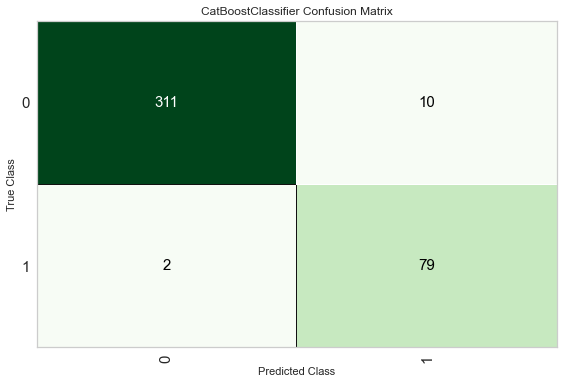

2021-01-01 15:46:14,535 - INFO     - Visual Rendered Successfully
2021-01-01 15:46:14,765 - INFO     - plot_model() succesfully completed......................................


In [38]:
plot_model(melhor_modelo, plot = 'confusion_matrix')

In [39]:
pred

,age,bmi,charges,sex_female,children_0,children_1,children_2,children_3,region_northeast,region_northwest,region_southeast,region_southwest,smoker,Label,Score
0,-1.413722,0.796716,-0.954021,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,no,no,0.9994
1,1.296382,0.140978,-0.157781,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,no,no,0.9994
2,0.868471,1.038304,-0.367335,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,no,no,0.9996
3,0.725834,0.977497,-0.237492,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,no,no,0.9996
4,-1.271085,-1.377574,-0.916562,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,no,no,0.9981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397,1.296382,1.686647,-0.140302,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,no,no,0.9994
398,-1.342404,0.430226,-0.934821,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,no,no,0.9994
399,-1.342404,-0.311794,-0.887513,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,no,no,0.9985
400,-0.914493,-0.595290,0.308974,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,yes,yes,0.9832


## Queremos selecionar aqueles em que a resposta observada é não fumante, mas que nosso modelo indica que é fumante. Vamos ordenar o resultado pelo Score, pois quanto mais alto, maior a probabilidade ser fumante e, portanto, maior o risco de ser um fraudador.¶


In [40]:
possiveis_fraudes = pred[(pred['Label'] == 'yes') & (pred['smoker'] == 'no')].sort_values(by = 'Score', ascending = False)
possiveis_fraudes

,age,bmi,charges,sex_female,children_0,children_1,children_2,children_3,region_northeast,region_northwest,region_southeast,region_southwest,smoker,Label,Score
45,1.510338,-0.343019,1.393125,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,no,yes,0.9842
134,0.511878,-0.506543,0.929091,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,no,yes,0.9240
334,0.369241,-0.155665,1.544770,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,no,yes,0.8519
16,-0.415263,-1.311014,0.714291,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,no,yes,0.8246
42,0.797152,-0.468744,0.530949,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,no,yes,0.8079
291,1.795612,-0.983145,1.385466,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,no,yes,0.7755
242,1.652975,1.015296,1.504685,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,no,yes,0.5830
46,-1.342404,0.760561,1.185123,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,no,yes,0.5735
67,1.296382,-1.101474,0.731350,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,no,yes,0.5266
373,0.797152,-0.545986,1.015511,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,no,yes,0.5024


## Portanto, o conjunto de dados acima é uma lista dos possíveis fraudadores, ordenada por aqueles mais prováveis de serem de fato fraudadores. Uma instituição poderia, por exemplo, tem um patamar em que caso a probabilidade seja maior que esse patamar, então uma investigação seria realizada. Por exemplo, se esse patamar fosse 70%, os individuos a serem investigados então seriam os seguintes:¶


In [41]:
investigar = possiveis_fraudes[possiveis_fraudes['Score'] > 0.7]
investigar

,age,bmi,charges,sex_female,children_0,children_1,children_2,children_3,region_northeast,region_northwest,region_southeast,region_southwest,smoker,Label,Score
45,1.510338,-0.343019,1.393125,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,no,yes,0.9842
134,0.511878,-0.506543,0.929091,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,no,yes,0.9240
334,0.369241,-0.155665,1.544770,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,no,yes,0.8519
16,-0.415263,-1.311014,0.714291,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,no,yes,0.8246
42,0.797152,-0.468744,0.530949,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,no,yes,0.8079
291,1.795612,-0.983145,1.385466,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,no,yes,0.7755


## Finalizando o modelo para uso futuro

In [42]:
modelo_final = finalize_model(melhor_modelo)

2021-01-01 15:46:42,470 - INFO     - Initializing finalize_model()
2021-01-01 15:46:42,472 - INFO     - finalize_model(estimator=<catboost.core.CatBoostClassifier object at 0x00000227DC904070>, fit_kwargs=None, groups=None, model_only=True, display=None)
2021-01-01 15:46:42,473 - INFO     - Finalizing <catboost.core.CatBoostClassifier object at 0x00000227DC904070>
2021-01-01 15:46:42,475 - INFO     - Initializing create_model()
2021-01-01 15:46:42,476 - INFO     - create_model(estimator=<catboost.core.CatBoostClassifier object at 0x00000227DC904070>, fold=None, round=4, cross_validation=True, predict=True, fit_kwargs={}, groups=None, refit=True, verbose=False, system=False, metrics=None, display=None, kwargs={})
2021-01-01 15:46:42,477 - INFO     - Checking exceptions
2021-01-01 15:46:42,479 - INFO     - Importing libraries
2021-01-01 15:46:42,480 - INFO     - Copying training dataset
2021-01-01 15:46:42,482 - INFO     - Defining folds
2021-01-01 15:46:42,484 - INFO     - Declaring met

In [43]:
# Salvando o modelo
save_model(modelo_final, 'meu-modelo-para-smoker')

2021-01-01 15:47:30,021 - INFO     - Initializing save_model()
2021-01-01 15:47:30,023 - INFO     - save_model(model=<catboost.core.CatBoostClassifier object at 0x00000227DE318850>, model_name=meu-modelo-para-smoker, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='smoker',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strat...
                ('rem_outliers',
                 Outlier(c

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='smoker',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strat...
                          target='smoker')),
                 ('cluster_all', 'passthrough'),
                 ('dummy', Dummify(target='smoker')),
                 ('fix_perfect', Remove_100(target='smoker')),
                 ('clean_names', Clean_Colum_Names()),
        

In [44]:
# Deploy Básico

def DetectorDeFumante(age, sex, bmi, children, region, charges):
    dados0 = {'age': [age], 'sex': [sex], 'bmi': [bmi], 'children': [children], 'region': [region], 'charges': [charges]}
    dados = pd.DataFrame(dados0)

    modelo = load_model('C:/Users/Silvio/Desktop/Medicos//meu-modelo-para-smoker')
  
    pred = predict_model(modelo, data = dados)
    resp = 'NÃO' if pred['Label'][0] == 'no' else 'SIM' 
    prob = pred['Score'][0] 


    print(' ')
    print('Idade: {}'.format(age))
    print('Sexo: {}'.format(sex))
    print('IMC: {}'.format(bmi))
    print('Crianças: {}'.format(children))
    print('Região: {}'.format(region))
    print('Custos: {}'.format(charges))
    print(' ')
    print('É fumante?: {}, com probabilidade {:.2f}%'.format(resp, 100*prob)) 

In [45]:
DetectorDeFumante(age = 30, sex = 'male', bmi = 25, children = 0, region = 'southwest', charges = 20000)

2021-01-01 15:48:37,937 - INFO     - Initializing load_model()
2021-01-01 15:48:37,939 - INFO     - load_model(model_name=C:/Users/Silvio/Desktop/Medicos//meu-modelo-para-smoker, platform=None, authentication=None, verbose=True)
2021-01-01 15:48:38,008 - INFO     - Initializing predict_model()
2021-01-01 15:48:38,011 - INFO     - predict_model(estimator=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='smoker',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_va

Transformation Pipeline and Model Successfully Loaded
 
Idade: 30
Sexo: male
IMC: 25
Crianças: 0
Região: southwest
Custos: 20000
 
É fumante?: SIM, com probabilidade 96.13%


## Análise Exploratória de Dados 

In [46]:
#ultimas linhas
dados.tail()

,age,sex,bmi,children,smoker,region,charges
1333,50,male,30.97,3,no,northwest,10600.5483
1334,18,female,31.92,0,no,northeast,2205.9808
1335,18,female,36.85,0,no,southeast,1629.8335
1336,21,female,25.80,0,no,southwest,2007.9450
1337,61,female,29.07,0,yes,northwest,29141.3603


In [47]:
dados.sample().T

,559
age,19
sex,male
bmi,35.53
children,0
smoker,no
region,northwest
charges,1646.43


In [48]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


In [49]:
dados.size

9366

In [50]:
# formato do dataset (linhas; colunas)
dados.shape

(1338, 7)

In [51]:
# lista de todas as colunas do dataset
dados.columns

Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'charges'], dtype='object')

In [52]:
# verificação da presença de valores ausentes no dataset é de extrema importância, pois é o reflexo direto da qualidade do mesmo.
dados.isnull().sum()

age         0
sex         0
bmi         0
children    0
smoker      0
region      0
charges     0
dtype: int64

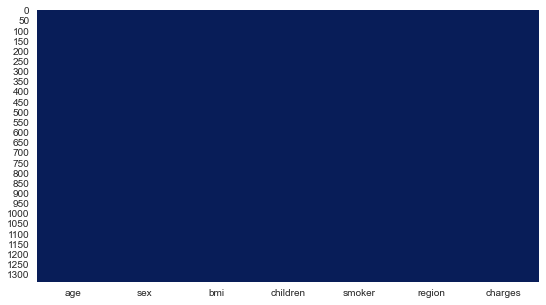

In [53]:
#Nenhum valor nulo encontrado no conjunto de dados
fig, ax = plt.subplots(figsize=(9,5))
sns.heatmap(dados.isnull(), cbar=False, cmap="YlGnBu_r")
plt.show();

In [54]:
# valores únicos para cada feature
dados.nunique().sort_values()

sex            2
smoker         2
region         4
children       6
age           47
bmi          548
charges     1337
dtype: int64

In [55]:
# retorna a quantidade de linha de todas as colunas
dados.count()

age         1338
sex         1338
bmi         1338
children    1338
smoker      1338
region      1338
charges     1338
dtype: int64

In [56]:
# Verificando o skew de cada atributo
dados.skew()

age         0.055673
bmi         0.284047
children    0.938380
charges     1.515880
dtype: float64

In [57]:
dados['sex'].value_counts()

male      676
female    662
Name: sex, dtype: int64

In [58]:
# Verifique se há duplicado
dados.duplicated().sum()

1

In [59]:
#Removendo duplicatas se houver
dados.drop_duplicates(keep=False, inplace=True)

In [60]:
#removendo duplicados colunas
_,i =np.unique(dados.columns, return_index=True)
data=dados.iloc[:, i]

In [61]:
# Tabela de Frequencia do TARGET
dados.smoker.value_counts()

no     1062
yes     274
Name: smoker, dtype: int64

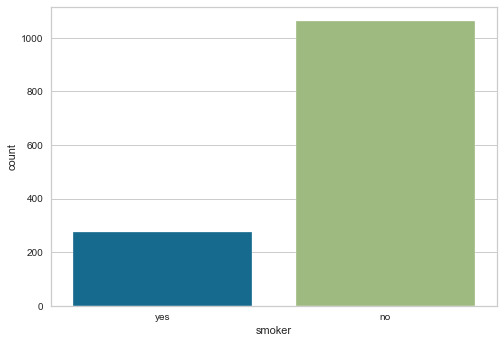

In [62]:
# Cria um gráfico de barras da variável Target
sns.countplot(dados['smoker']);

In [63]:
#Estatísticas descritivas das variáveis numéricas
dados.describe().round(2)

,age,bmi,children,charges
count,1336.00,1336.00,1336.00,1336.00
mean,39.24,30.66,1.10,13287.83
std,14.04,6.10,1.21,12110.70
min,18.00,15.96,0.00,1121.87
25%,27.00,26.27,0.00,4746.88
50%,39.00,30.38,1.00,9388.75
75%,51.00,34.70,2.00,16687.36
max,64.00,53.13,5.00,63770.43


In [64]:
dados.describe(include=['O'])

,sex,smoker,region
count,1336,1336,1336
unique,2,2,4
top,male,no,southeast
freq,674,1062,364


In [65]:
#Matriz de correlação - person
dados.corr().round(4)

,age,bmi,children,charges
age,1.0000,0.1094,0.0406,0.2976
bmi,0.1094,1.0000,0.0128,0.1985
children,0.0406,0.0128,1.0000,0.0668
charges,0.2976,0.1985,0.0668,1.0000


In [66]:
# Correlação de spearman - leva em consideração  a correlação positiva e negativa
dados.corr('spearman').round(4)

,age,bmi,children,charges
age,1.0000,0.1081,0.0546,0.5327
bmi,0.1081,1.0000,0.0157,0.1198
children,0.0546,0.0157,1.0000,0.1311
charges,0.5327,0.1198,0.1311,1.0000


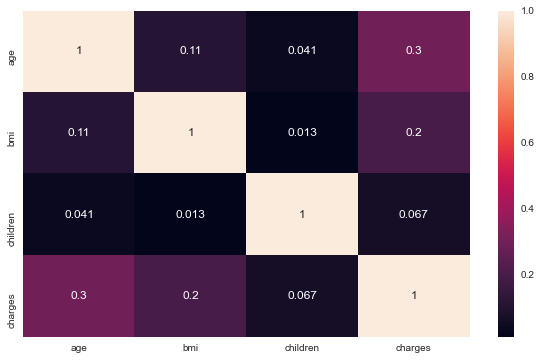

In [67]:
# Mapa de calor
plt.figure(figsize=(10,6))
sns.heatmap(dados.corr(),annot=True);

               age       bmi  children   charges
age       1.000000  0.109416  0.040600  0.297606
bmi       0.109416  1.000000  0.012750  0.198461
children  0.040600  0.012750  1.000000  0.066779
charges   0.297606  0.198461  0.066779  1.000000


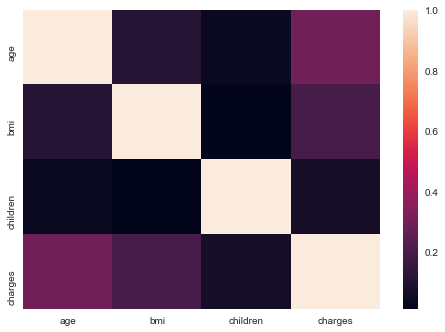

In [68]:
corr = dados.corr()
print(corr)
sns.heatmap(corr, 
         xticklabels=corr.columns, 
         yticklabels=corr.columns);

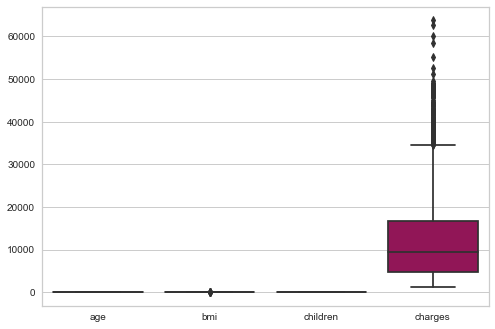

In [69]:
#No gráfico podemos notar que existem alguns outliers nos atributos de cobrança!
sns.boxplot(data=dados);

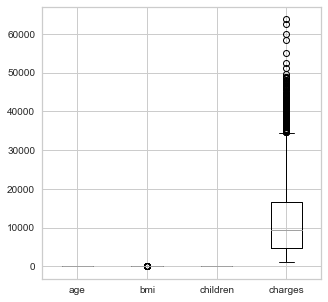

In [70]:
# Cria um gráfico tipo box and whisker plots (o famoso boxplot)

dados.boxplot(figsize=(5,5));

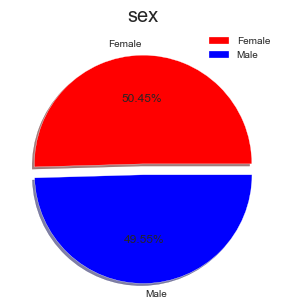

In [71]:
labels = ['Female', 'Male']
size = dados['sex'].value_counts()
colors = ['red', 'blue']
explode = [0, 0.1]

plt.rcParams['figure.figsize'] = (5, 5)
plt.pie(size, colors = colors, explode = explode, labels = labels, shadow = True, autopct = '%.2f%%')
plt.title('sex', fontsize = 20)
plt.axis('off')
plt.legend()
plt.show();

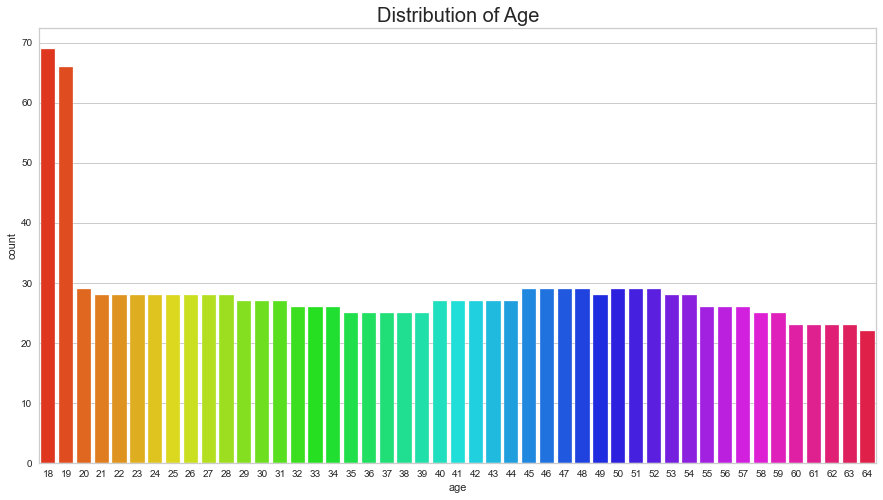

In [72]:
plt.rcParams['figure.figsize'] = (15, 8)
sns.countplot(dados['age'], palette = 'hsv')
plt.title('Distribution of Age', fontsize = 20)
plt.show();

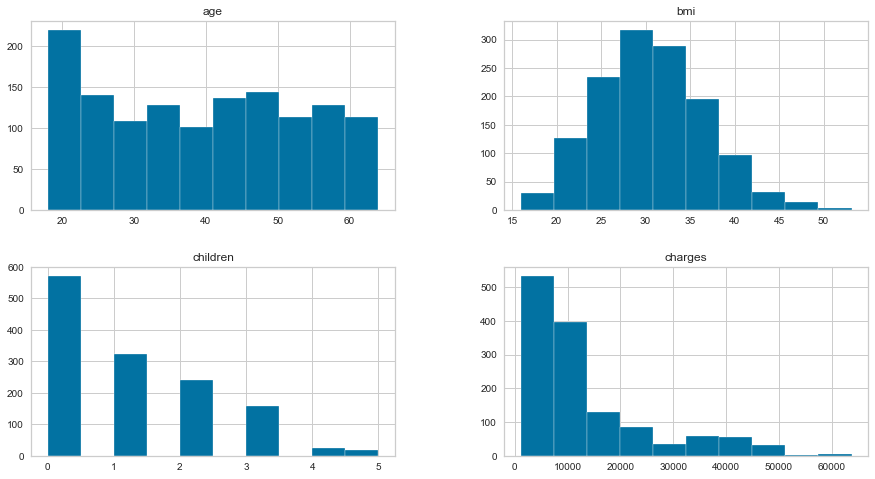

In [73]:
#cria um gráfico conhecido como histohrama
dados.hist()
plt.show();

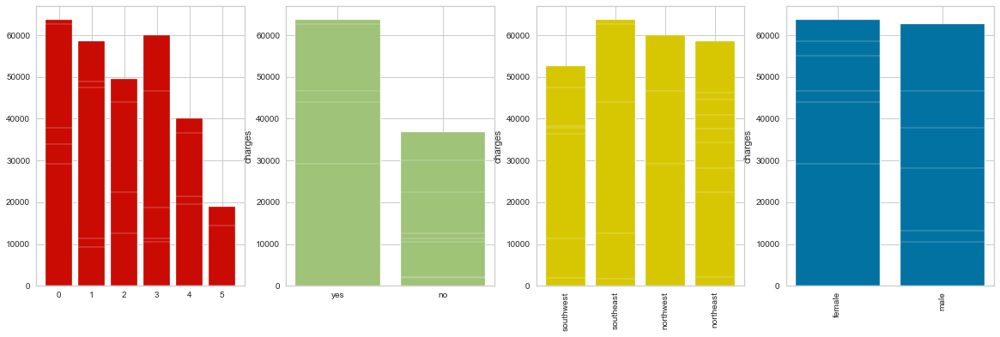

In [74]:
fig, ax = plt.subplots(1,4, figsize=(20,6))
ax[0].bar(dados.children, dados.charges, color='r')
ax[1].bar(dados.smoker, dados.charges, color='g')
ax[2].bar(dados.region, dados.charges, color='y')
ax[3].bar(dados.sex, dados.charges)

ax[2].set_xticklabels(labels=dados['region'].unique(),rotation = 90)
ax[3].set_xticklabels(labels=dados['sex'].unique(),rotation = 90)

for i in ax[1:4]:
    i.set_ylabel('charges')
plt.show();

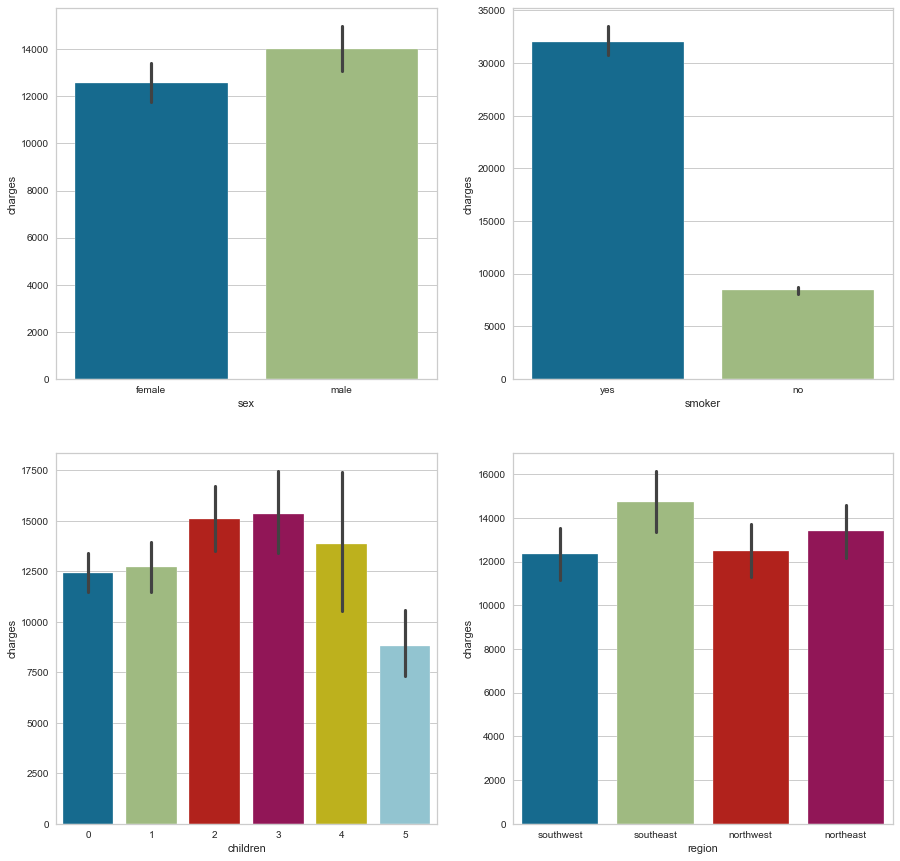

In [75]:
fig = plt.figure(figsize = (15, 15))
fig.add_subplot(221)
sns.barplot(data = dados, x = 'sex', y = 'charges')
fig.add_subplot(222)
sns.barplot(data = dados, x = 'smoker', y = 'charges')
fig.add_subplot(223)
sns.barplot(data = dados, x = 'children', y = 'charges')
fig.add_subplot(224)
sns.barplot(data = dados, x = 'region', y = 'charges');

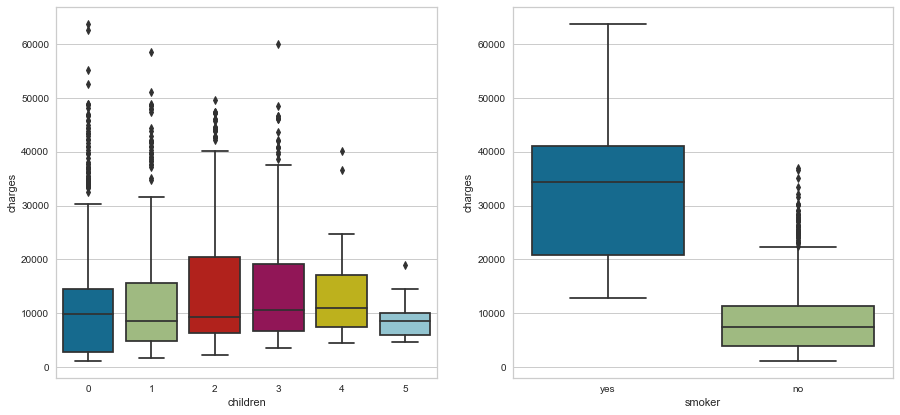

In [76]:
fig = plt.figure(figsize = (15, 15))
fig.add_subplot(221)
sns.boxplot(data = dados, x = 'children', y = 'charges')
fig.add_subplot(222)
sns.boxplot(data = dados, x = 'smoker', y = 'charges');

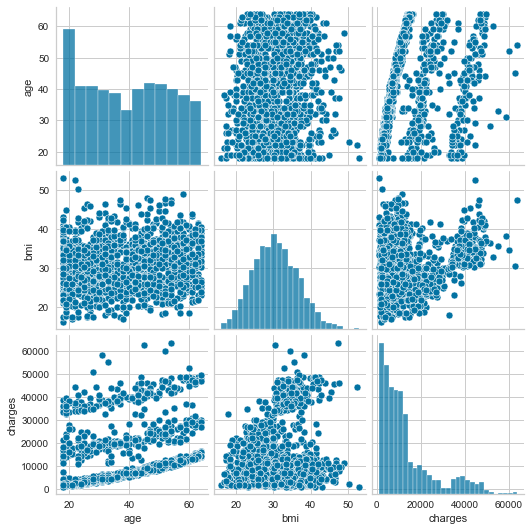

In [77]:
sns.pairplot(dados, vars = ['age', 'bmi', 'charges']);

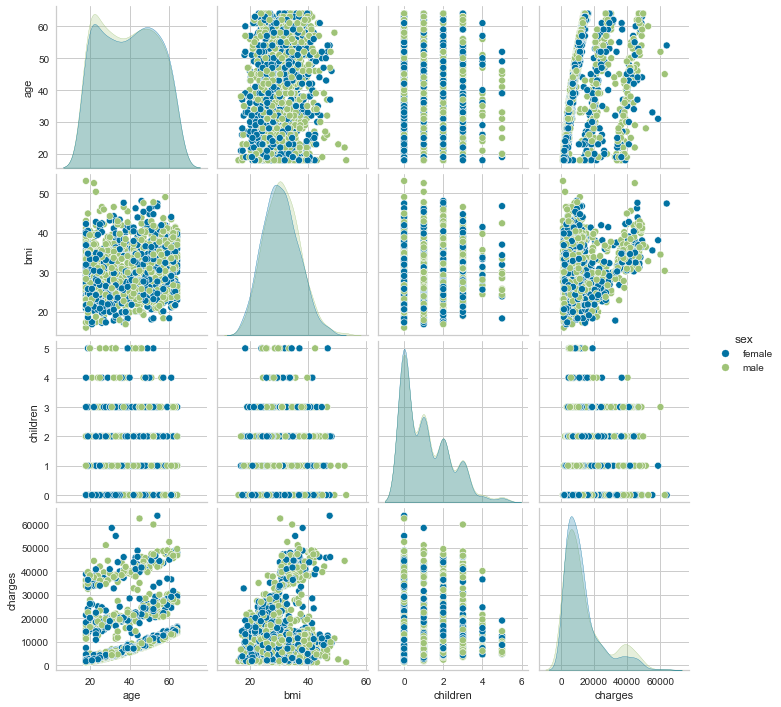

In [78]:
sns.pairplot(dados, vars= ['age','bmi','children','charges'], hue='sex');

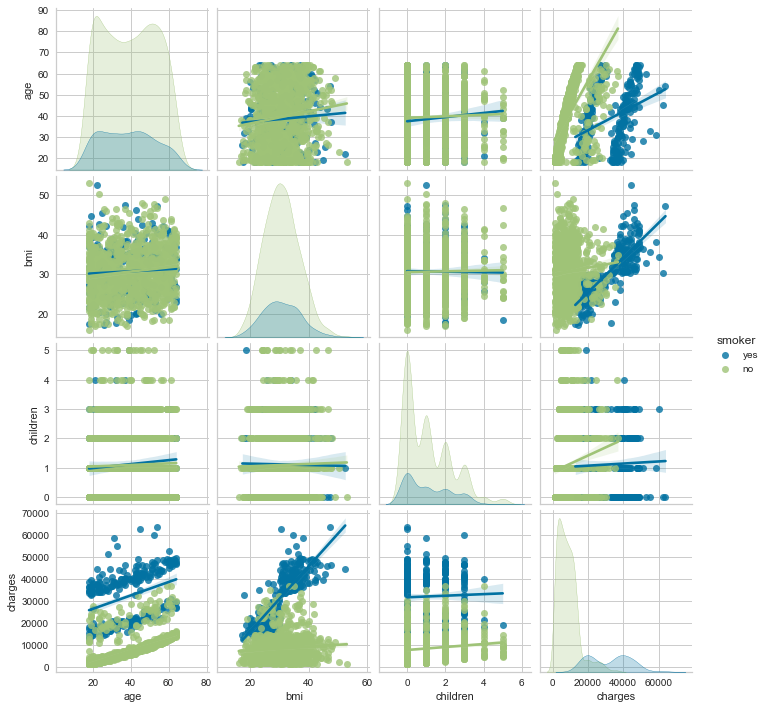

In [79]:
# Criação do Gráfico de dispersão (scatter) conhecido como pairplot
sns.pairplot(dados, hue='smoker', kind="reg"); # kind=reg é a reta de regressão

In [80]:
fig = px.histogram(dados, 
                   x='bmi', 
                   marginal='box', 
                   title='BMI Distribution')
fig.show();

In [81]:
fig = px.histogram(dados, x='bmi', 
                   color='sex', 
                   marginal='box', 
                   title='BMI Distribution Over Patients Sex')
fig.show();

In [82]:
fig = px.histogram(dados, x='bmi', 
                   color='region', 
                   marginal='box', 
                   title='BMI Distribution Over Patients Region')
fig.show();

In [83]:
fig = px.histogram(dados, x='bmi', 
                   color='smoker', 
                   marginal='box', 
                   title='BMI Distribution Following Smoking Activity')
fig.show();

In [84]:
fig = px.histogram(dados, 
                   x='charges', 
                   marginal='box', 
                   title='Charges Distribution')
fig.show();

In [85]:
fig = px.density_contour(dados, x="age", y="charges",
                         facet_col="sex",
                         color='smoker',
                         marginal_x="histogram",
                         marginal_y="histogram")
fig.show();

In [86]:
fig = px.scatter(dados, x="bmi", y="charges", color="smoker",
                 size='charges')
fig.update_layout(title_text='charges = f(bmi)')
fig.show();

In [87]:
fig = go.Figure()

for n_children in data.children.unique():
    dados = data.loc[data.children == n_children]
    fig.add_trace(go.Box(
        y=dados.charges.values,
        name=str(n_children),
        boxpoints='all',
        jitter=0.5,
        whiskerwidth=0.2,
        #fillcolor=cls,
        marker_size=2,
        line_width=1)
    )
fig.update_layout(title_text="Charges Distribution Over Possible Numbers of Children")
fig.show();

In [88]:
fig = go.Figure()

for region in data.region.unique():
    dados = data.loc[data.region == region]
    fig.add_trace(go.Box(
        y=dados.charges.values,
        name=region,
        boxpoints='all',
        jitter=0.5,
        whiskerwidth=0.2,
        #fillcolor=cls,
        marker_size=2,
        line_width=1)
    )
fig.update_layout(title_text="Charges Distribution Over Regions")
fig.show();

In [89]:
charge_dist =[dados['charges'].values]
group_labels = ['charges'] 

fig = ff.create_distplot(charge_dist, group_labels)
fig.update_layout(title_text='Charge Distribution plot')
fig.show();

In [90]:
# age distribution

age_dist =[dados["age"].values]
group_labels = ['age'] 

fig = ff.create_distplot(age_dist, group_labels)
fig.update_layout(title_text='Age Distribution plot')
fig.show();

In [91]:
fig = px.density_contour(dados[dados.smoker=='yes'], x='age', y='charges', marginal_x='box', marginal_y='box')
fig.show();

In [92]:
fig = px.scatter(dados[dados.smoker=='no'], x='age', y='charges')
fig.update_layout(title_text='Analysis in Age and Charges')
fig.show();

In [93]:
fig = px.scatter(dados, x='age', y='bmi', color='sex')
fig.update_layout(title_text='Analysis in Age and BMI on Sex Status')
fig.show();

In [94]:
fig = px.density_contour(dados, x='bmi', y='charges', marginal_x='box', marginal_y='box', color='sex')
fig.show();

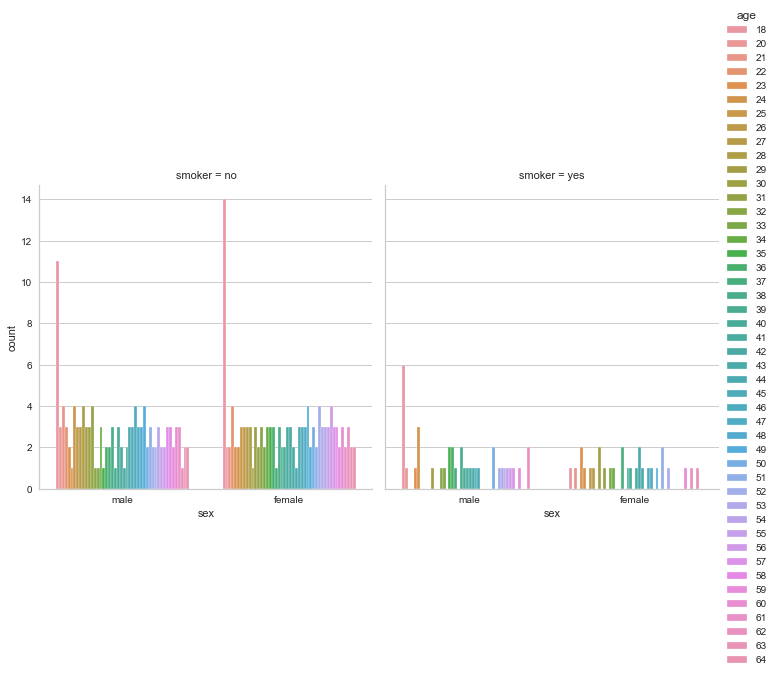

In [95]:
sns.set_style('whitegrid')
sns.catplot('sex', col = 'smoker', hue = 'age', data = dados, kind = 'count');

In [96]:
fig = px.box(dados, x='smoker', y='charges', points="all")
fig.update_layout(title_text="Charge Spread - Smoker and Non Smoker")
fig.show();

In [97]:
fig = px.box(dados, x='region', y='charges', points="all")
fig.update_layout(title_text="Region wise Charge Spread")
fig.show();

In [98]:
fig = px.violin(dados, y="charges", x="region", color='sex', box=True, points="all", hover_data=dados.columns)
fig.update_layout(title_text="Analysis in Charges and Region on Sex Status")
fig.show();

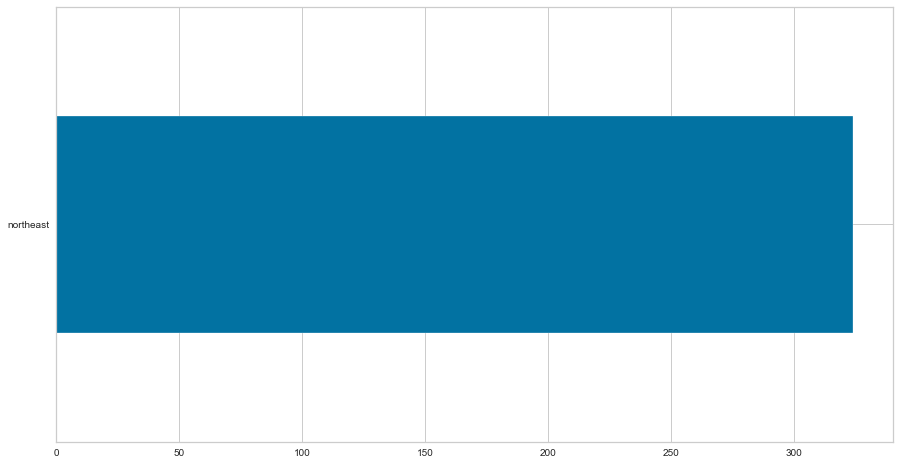

In [99]:
dados['region'].value_counts().plot(kind='barh');

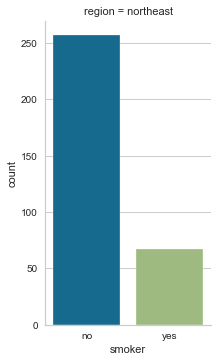

In [100]:
sns.set_style('whitegrid')
sns.catplot(x = 'smoker', col = 'region', data = dados, kind = 'count', aspect = 0.6);

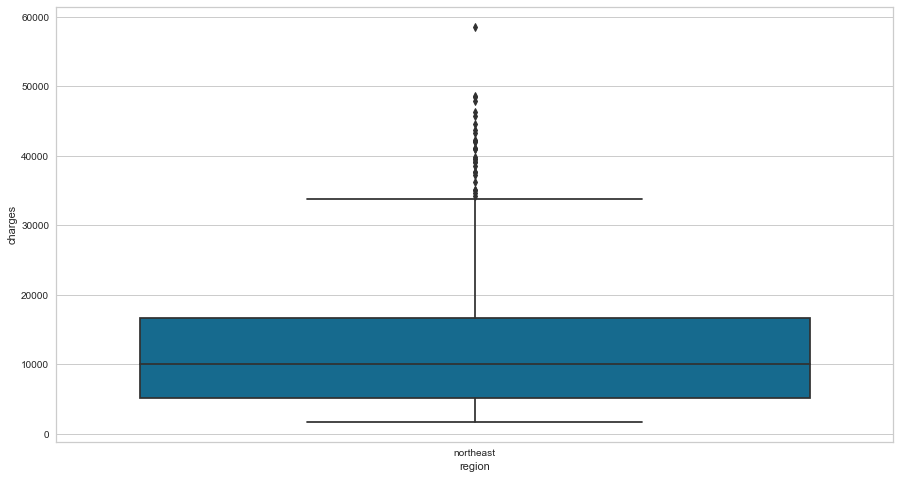

In [101]:
ax = sns.boxplot(x="region", y="charges", data=dados)

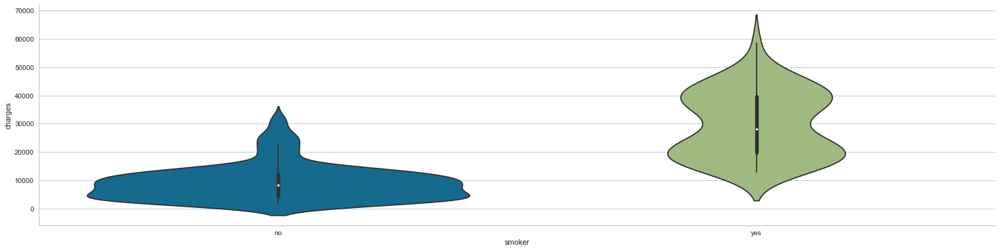

In [102]:
sns.catplot(x = 'smoker',y = 'charges',kind = 'violin',data = dados,aspect=4);

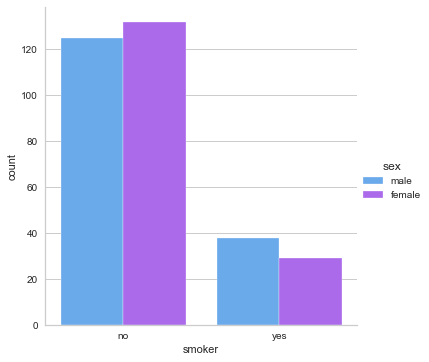

In [103]:
sns.catplot(x="smoker", kind="count",hue = 'sex', palette="cool", data=dados);

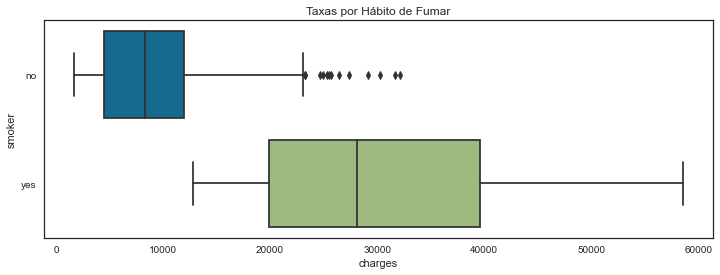

In [104]:
sns.set_style('white')
plt.figure(figsize = (12, 4))
sns.boxplot(y = dados['smoker'], x = dados['charges'])
plt.title('Taxas por Hábito de Fumar');

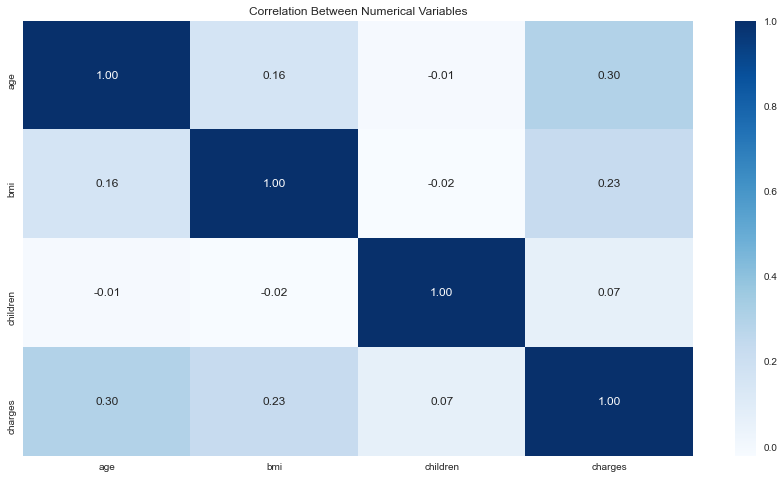

In [105]:
correlation = correlation = dados[['age', 'bmi', 'children', 'charges']].corr()
sns.heatmap(correlation, annot = True, fmt = '.2f', cmap = 'Blues')
plt.title('Correlation Between Numerical Variables');

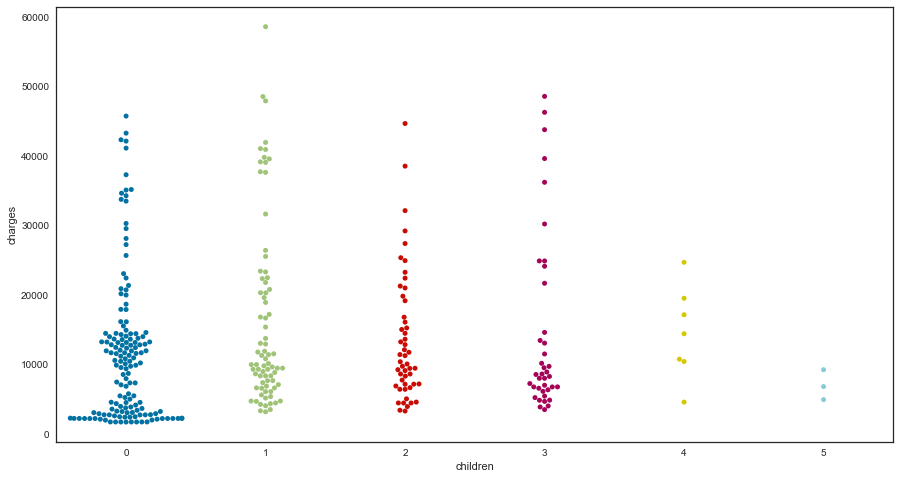

In [106]:
ax = sns.swarmplot(x="children", y="charges", data=dados);

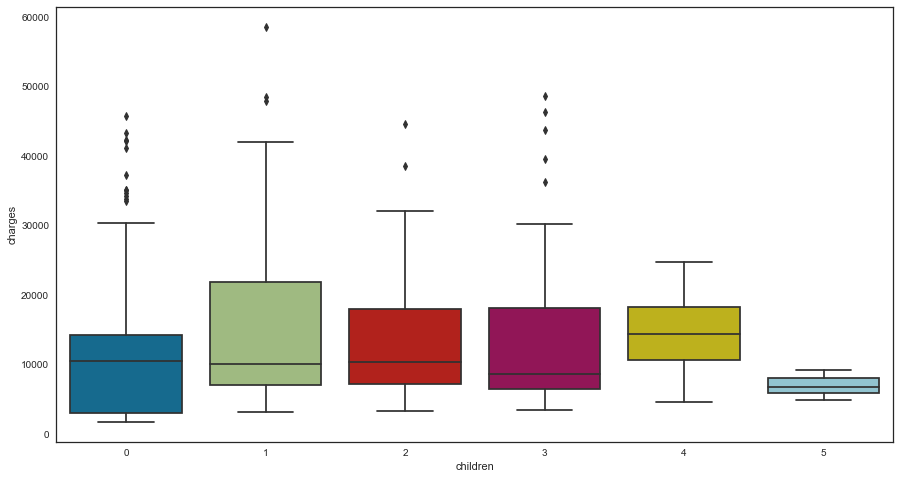

In [107]:
ax = sns.boxplot(x="children", y="charges", data=dados);

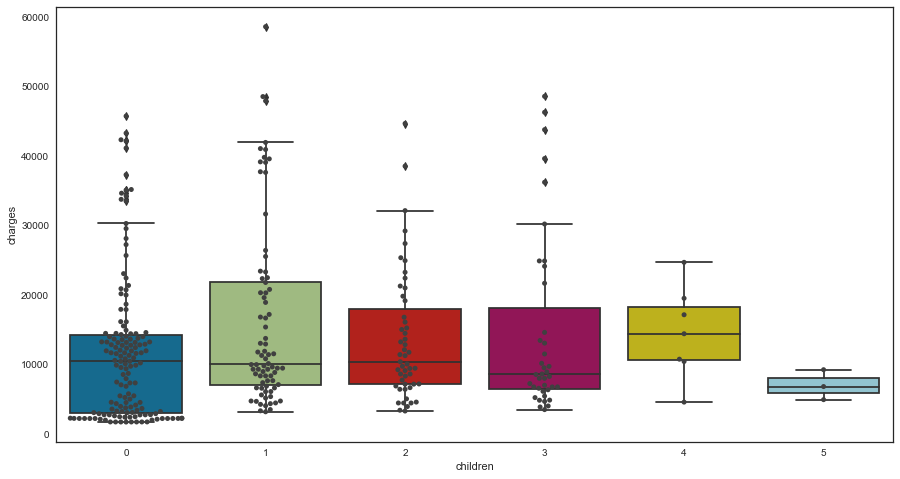

In [108]:
ax = sns.swarmplot(x="children", y="charges", data=dados, color=".25")
ax = sns.boxplot(x="children", y="charges", data=dados);

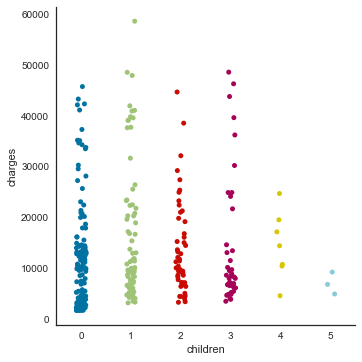

In [109]:
ax = sns.catplot(x="children", y="charges", data=dados)

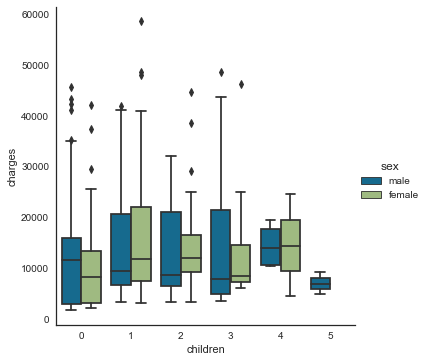

In [110]:
ax = sns.catplot(x="children", y='charges', hue='sex', kind='box',data=dados);

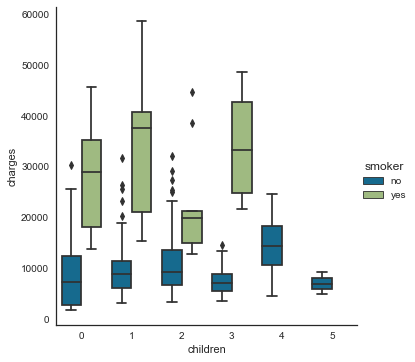

In [111]:
sns.catplot(x="children", y='charges', hue='smoker', kind='box',data=dados);

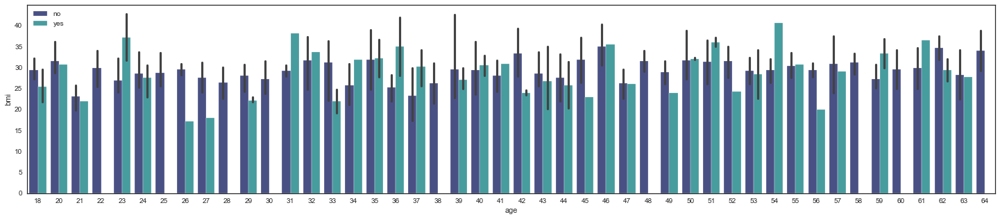

In [112]:
plt.figure(figsize=(25,5))
sns.barplot('age','bmi',hue='smoker',data=dados,palette='mako')
plt.legend();

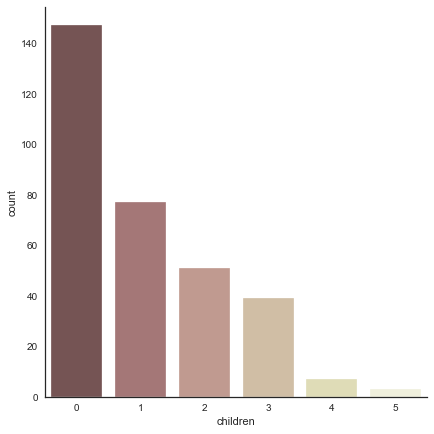

In [113]:
sns.catplot(x="children", kind="count", palette="pink", data=dados, size = 6);

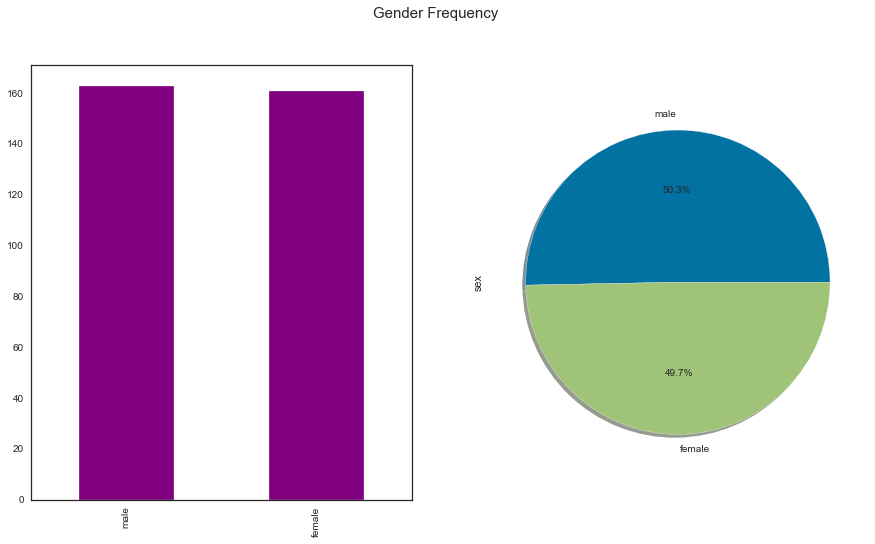

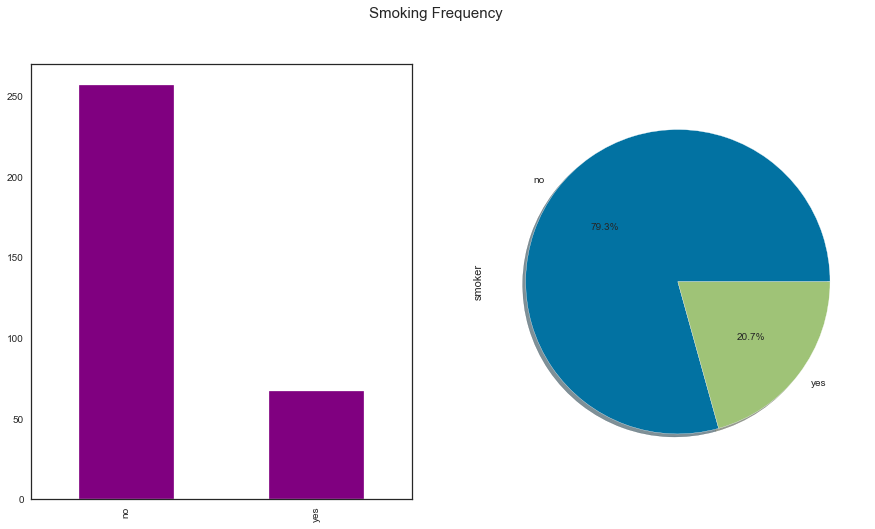

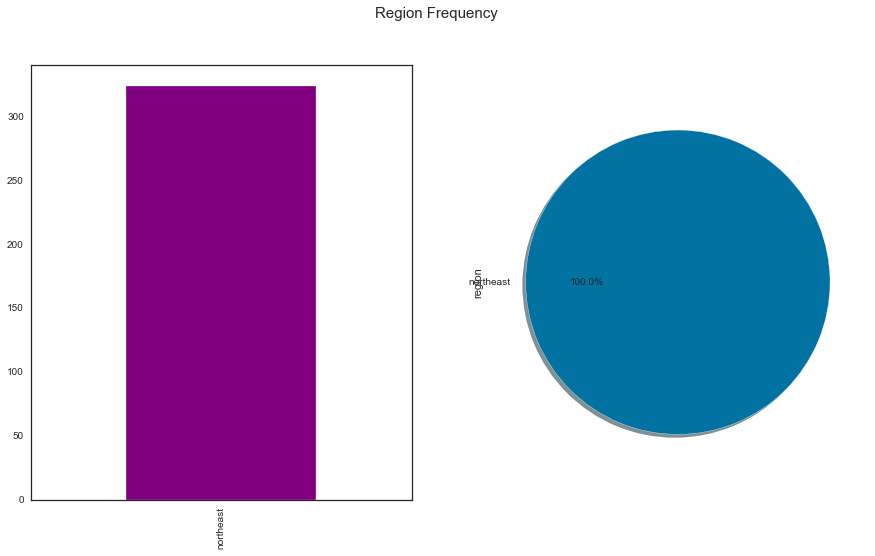

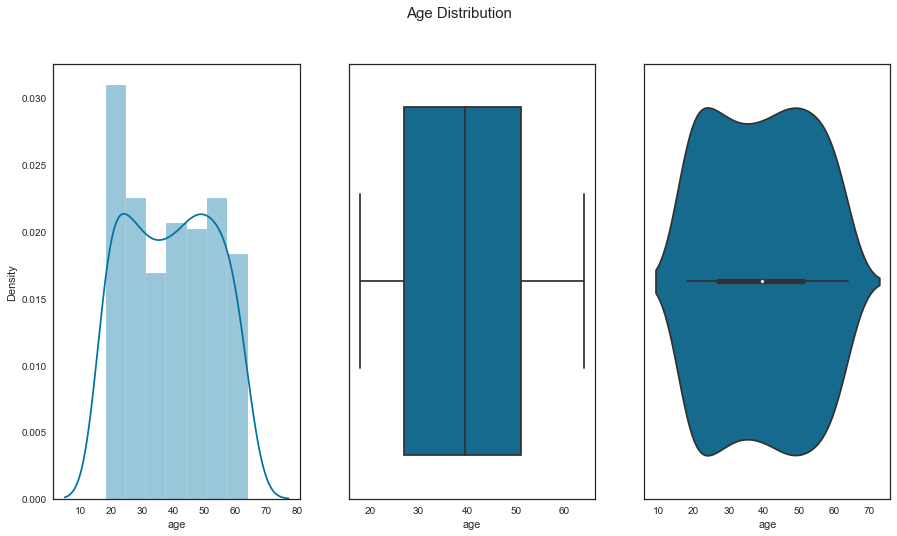

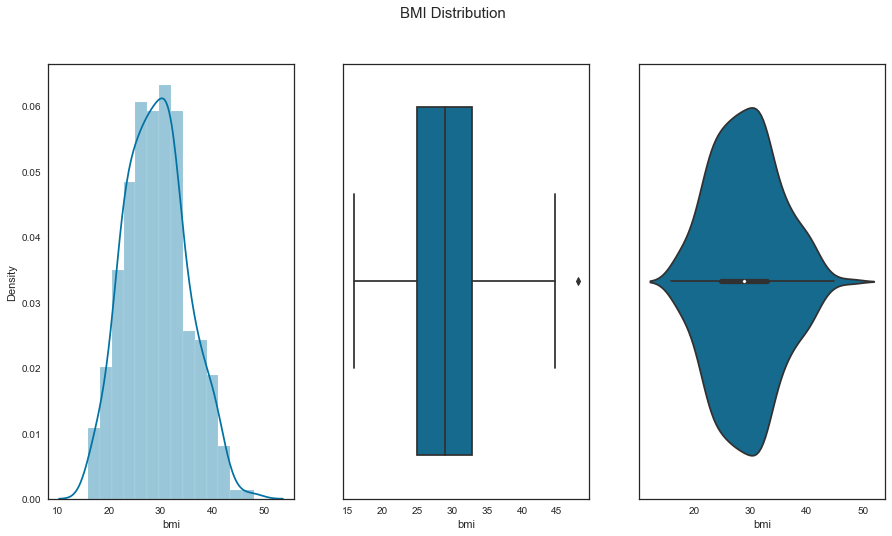

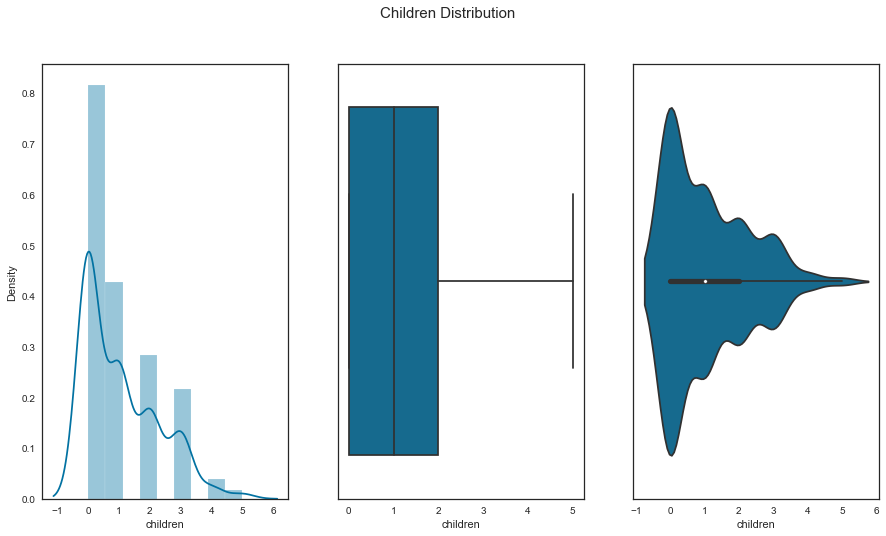

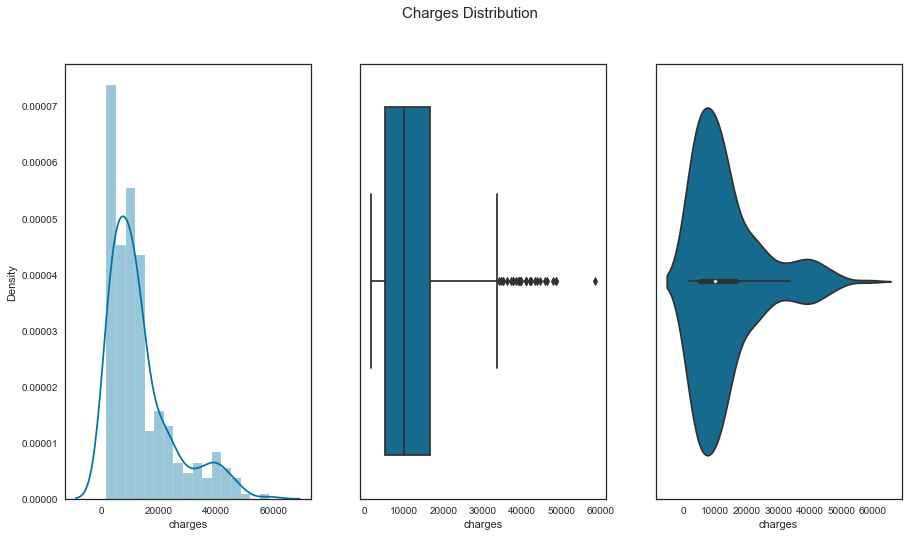

In [114]:
#Plotting Categorical Variables
fig, ax = plt.subplots(1, 2)
dados["sex"].value_counts().plot.bar(color="purple", ax=ax[0])
dados["sex"].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10},ax=ax[1])
fig.suptitle("Gender Frequency", fontsize=15)
plt.xticks(rotation=90)
plt.yticks(rotation=45)

fig, ax = plt.subplots(1, 2)
dados["smoker"].value_counts().plot.bar(color="purple", ax=ax[0])
dados["smoker"].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10},ax=ax[1])
fig.suptitle("Smoking Frequency", fontsize=15)
plt.xticks(rotation=90)
plt.yticks(rotation=45)

fig, ax = plt.subplots(1, 2)
dados["region"].value_counts().plot.bar(color="purple", ax=ax[0])
dados["region"].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10},ax=ax[1])
fig.suptitle("Region Frequency", fontsize=15)
plt.xticks(rotation=90)
plt.yticks(rotation=45)


#Plotting Numerical Variables
fig, ax = plt.subplots(1, 3)
fig.suptitle("Age Distribution", fontsize=15)
sns.distplot(dados["age"], ax=ax[0])
sns.boxplot(dados["age"], ax=ax[1])
sns.violinplot(dados["age"], ax=ax[2])

fig, ax = plt.subplots(1, 3)
fig.suptitle("BMI Distribution", fontsize=15)
sns.distplot(dados["bmi"], ax=ax[0])
sns.boxplot(dados["bmi"], ax=ax[1])
sns.violinplot(dados["bmi"], ax=ax[2])

fig, ax = plt.subplots(1, 3)
fig.suptitle("Children Distribution", fontsize=15)
sns.distplot(dados["children"], ax=ax[0])
sns.boxplot(dados["children"], ax=ax[1])
sns.violinplot(dados["children"], ax=ax[2])

fig, ax = plt.subplots(1, 3)
fig.suptitle("Charges Distribution", fontsize=15)
sns.distplot(dados["charges"], ax=ax[0])
sns.boxplot(dados["charges"], ax=ax[1])
sns.violinplot(dados["charges"], ax=ax[2]);

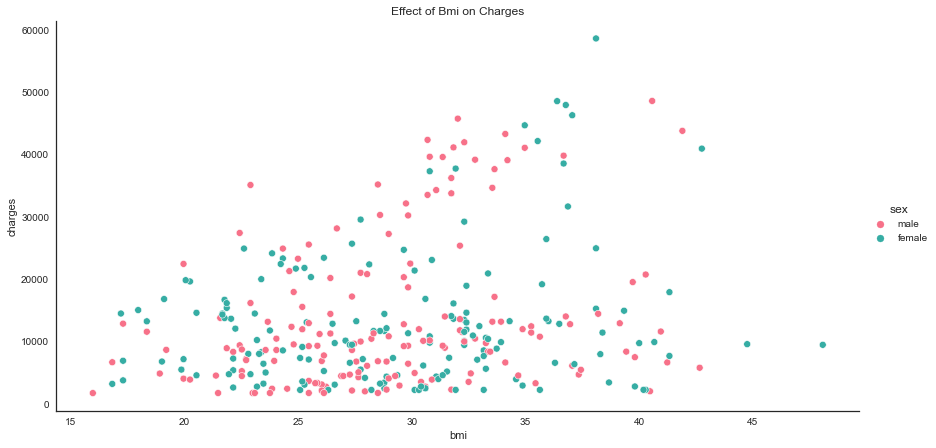

In [115]:
sns.relplot(x='bmi', y='charges', hue= 'sex', data=dados, palette='husl',aspect=2,height=6)
plt.title('Effect of Bmi on Charges');

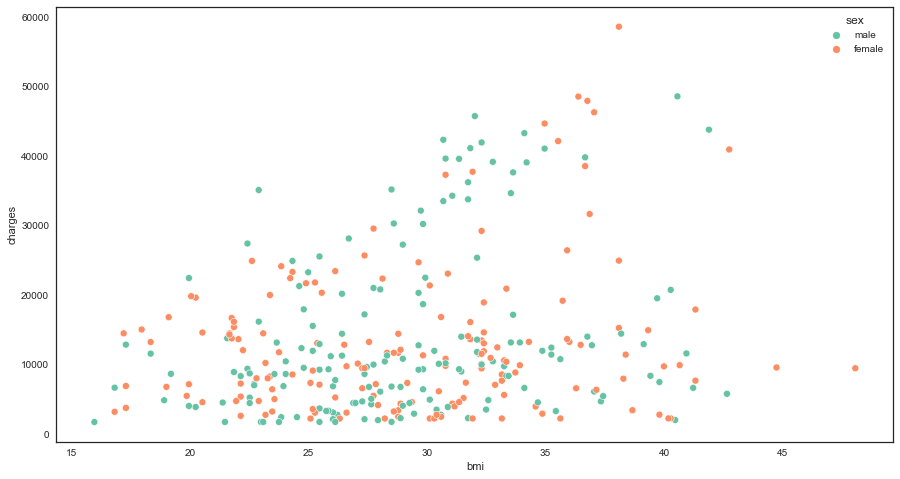

In [116]:
sns.scatterplot(x="bmi", y="charges", data=dados, palette='Set2', hue='sex');

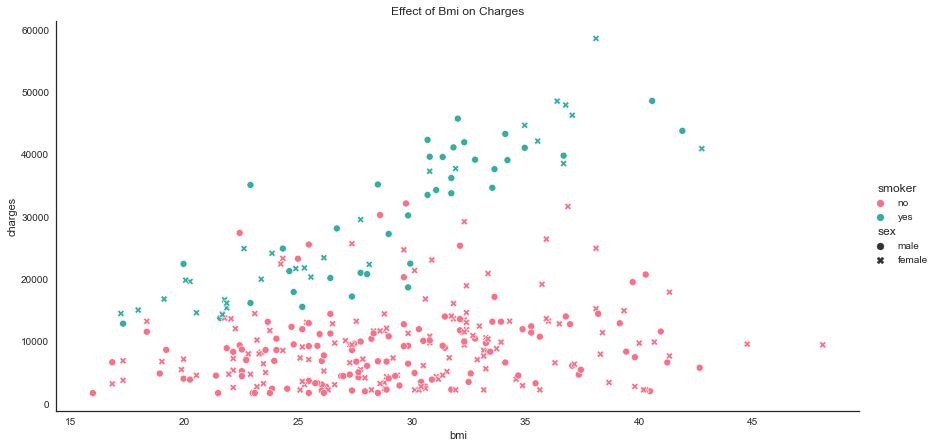

In [117]:
sns.relplot(x='bmi', y='charges', style= 'sex', hue= 'smoker', data=dados, palette='husl',aspect=2,height=6)
plt.title('Effect of Bmi on Charges');

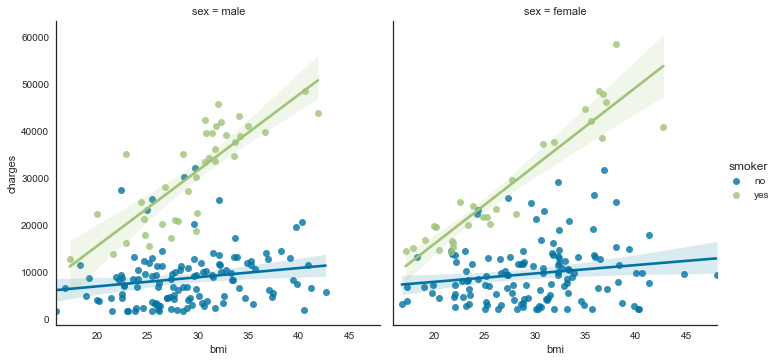

In [118]:
sns.lmplot(x='bmi',y='charges',hue='smoker', col='sex',data=dados);

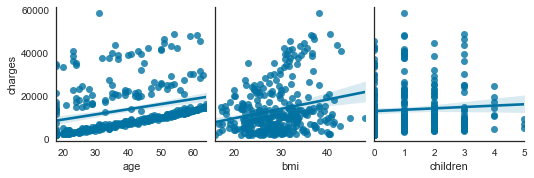

In [119]:
feature_cols = ['age', 'bmi','children']
# múltiplos gráficos de dispersão, observe que não estamos incluindo 'sexo' e 'fumante', por quê? porque é catogóricoة
sns.pairplot(dados, x_vars=feature_cols, y_vars='charges', kind='reg');

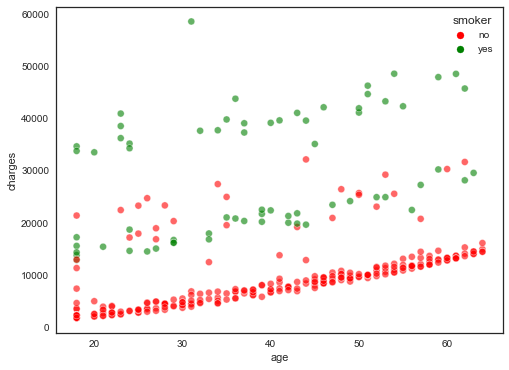

In [120]:
#Gráfico de dispersão para ver se há uma dependência entre os atributos do fumante e as cobranças em diferentes idades
plt.figure(figsize=(8,6))
sns.scatterplot(dados.age, dados.charges,hue=dados.smoker,palette= ['red','green'] ,alpha=0.6)
plt.show();

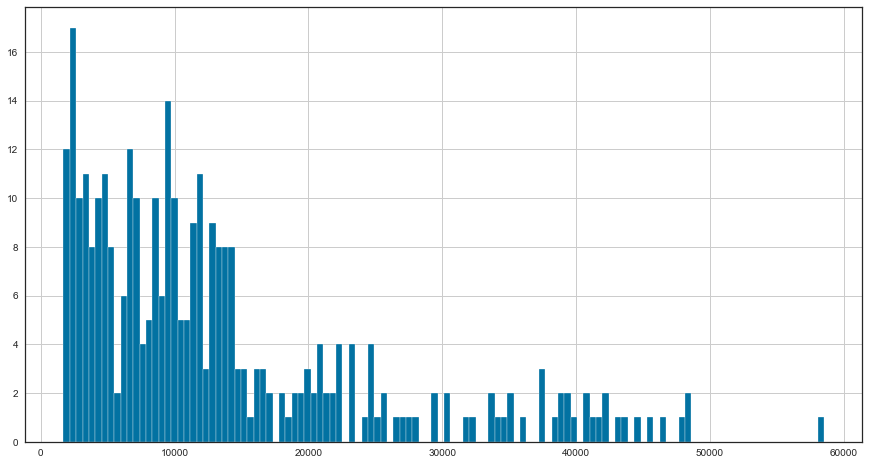

In [121]:
#charges: custos médicos individuais cobrados pelo plano de saúde
dados.charges.hist(bins=120);

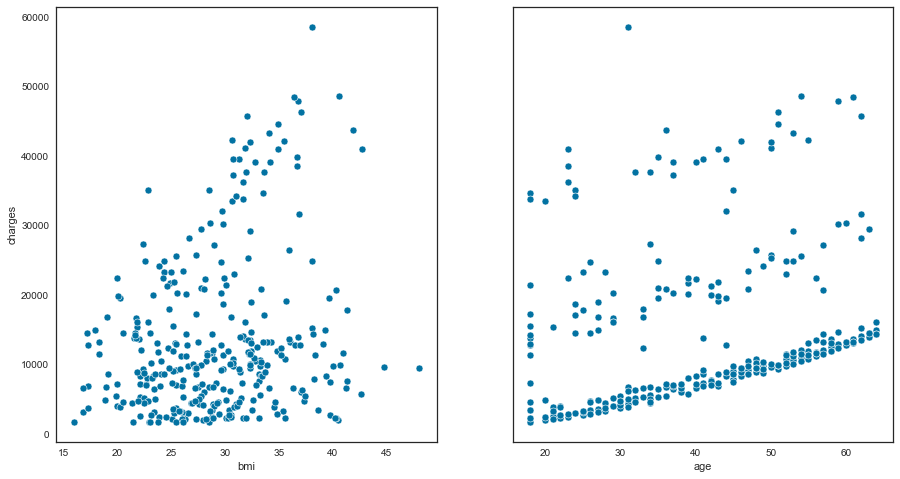

In [122]:
# bmi: índice de massa corporal da pessoa.
# age: idade da pessoa.
fig, axes = plt.subplots(1, 2, sharey=True)

plot_bmi = sns.scatterplot(y = 'charges', x = 'bmi', data=dados, ax = axes[0])
plot_age = sns.scatterplot(y = 'charges', x = 'age', data=dados, ax = axes[1])
plt.show();

<Figure size 576x432 with 0 Axes>

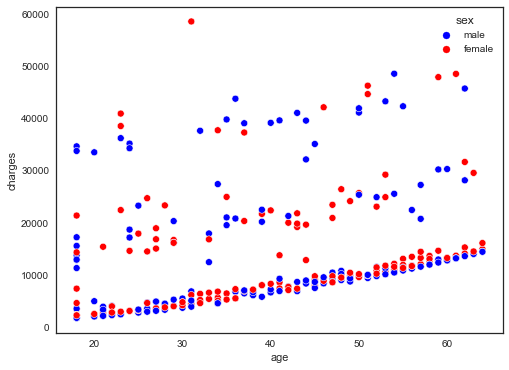

In [123]:
#Gráfico de dispersão para ver se há dependência entre os atributos sexo e cobranças em diferentes idades
plt.figure(figsize=(8,6))
plt.figure(figsize=(8,6))
sns.scatterplot(dados.age, dados.charges,hue=dados.sex,palette= ['blue','red'] )
plt.show();

<Figure size 576x432 with 0 Axes>

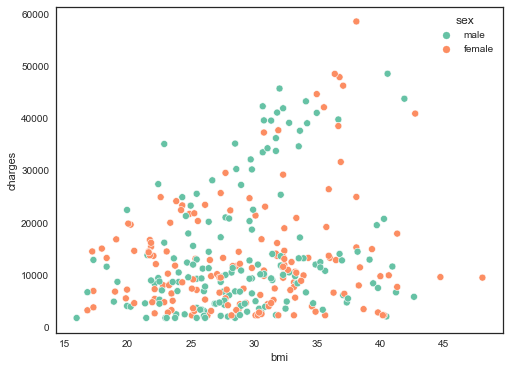

In [124]:
# Gráfico de dispersão para ver se há dependência entre os atributos sexo e cobranças em diferentes idades
plt.figure(figsize=(8,6))
plt.figure(figsize=(8,6))
sns.scatterplot(dados.bmi, dados.charges,hue=dados.sex,palette= 'Set2' )
plt.show();

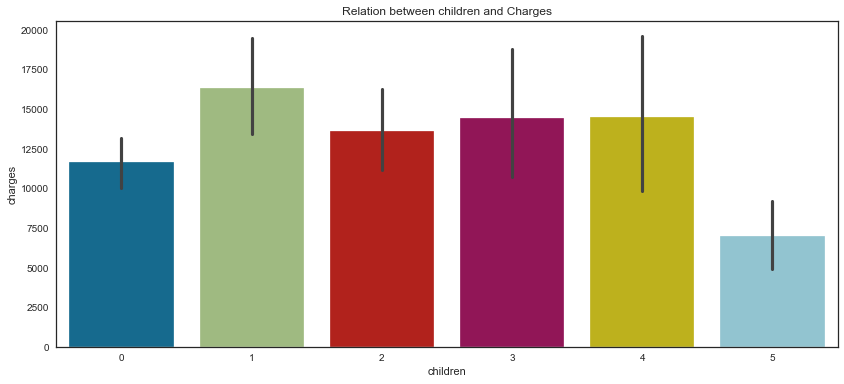

In [125]:
plt.figure(figsize=(14,6))
plt.title('Relation between children and Charges')
#sns.regplot(x=df['children'],y=df['charges'])
sns.barplot(x=dados['children'], y=dados['charges']);

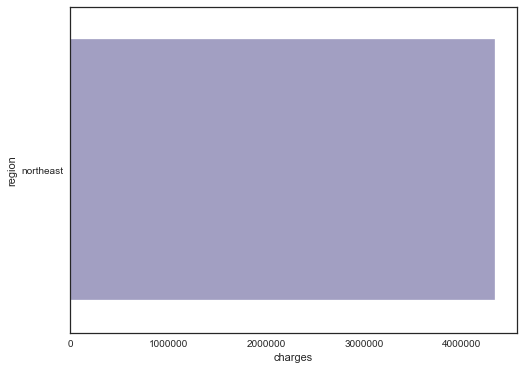

In [126]:
charges = dados['charges'].groupby(dados.region).sum().sort_values(ascending = True)
f, ax = plt.subplots(1, 1, figsize=(8, 6))
ax = sns.barplot(charges.head(), charges.head().index, palette='Purples');

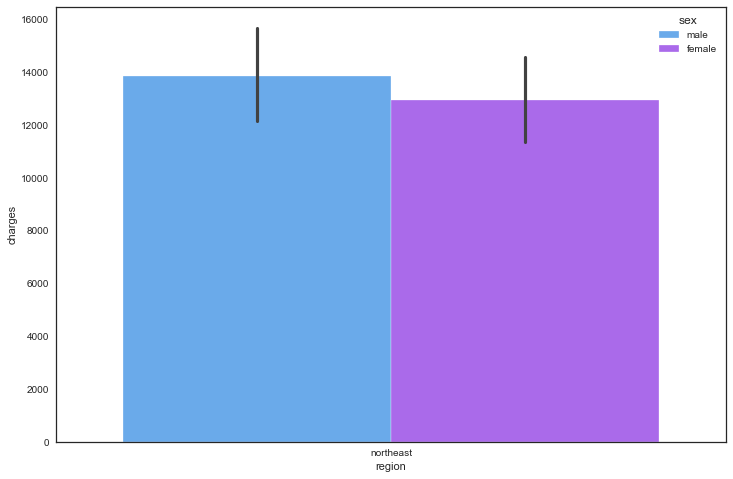

In [127]:
f, ax = plt.subplots(1, 1, figsize=(12, 8))
ax = sns.barplot(x='region', y='charges', hue='sex', data=dados, palette='cool');

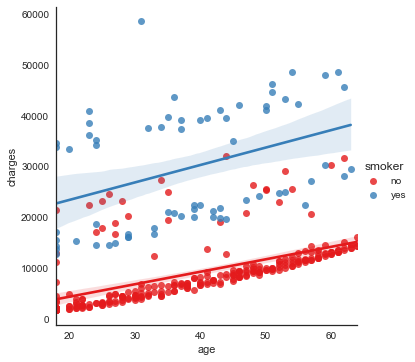

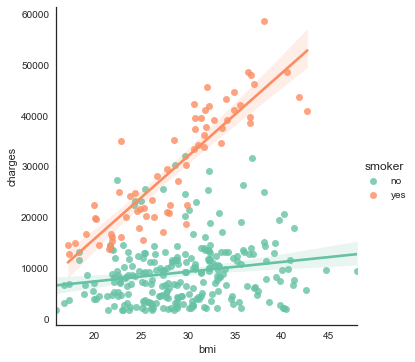

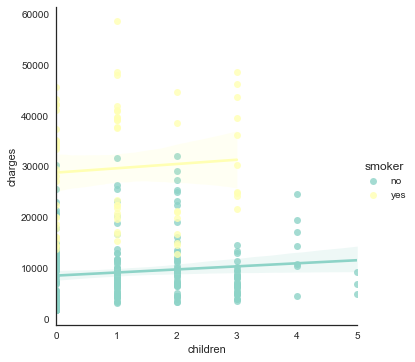

In [128]:
ax = sns.lmplot(x = 'age', y = 'charges', data=dados, hue='smoker', palette='Set1')
ax = sns.lmplot(x = 'bmi', y = 'charges', data=dados, hue='smoker', palette='Set2')
ax = sns.lmplot(x = 'children', y = 'charges', data=dados, hue='smoker', palette='Set3');

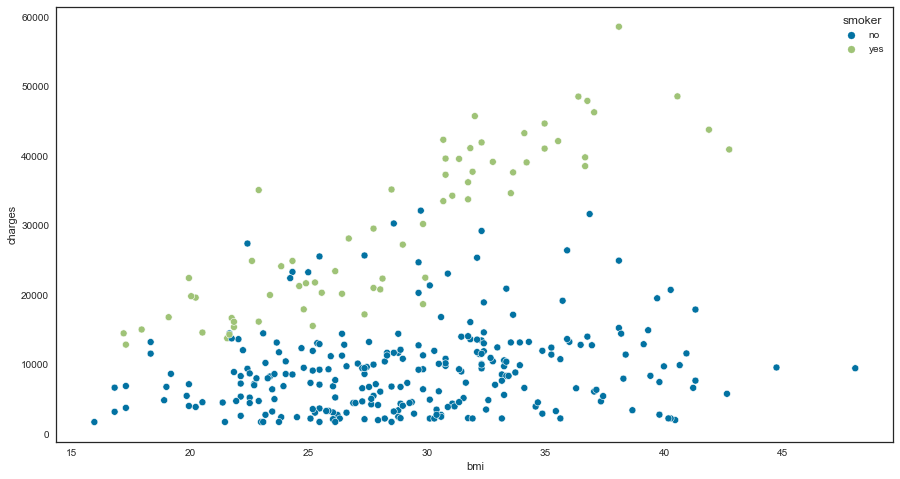

In [129]:
import seaborn as sns
sns.scatterplot(x = 'bmi', y = 'charges', hue = 'smoker', data = dados);

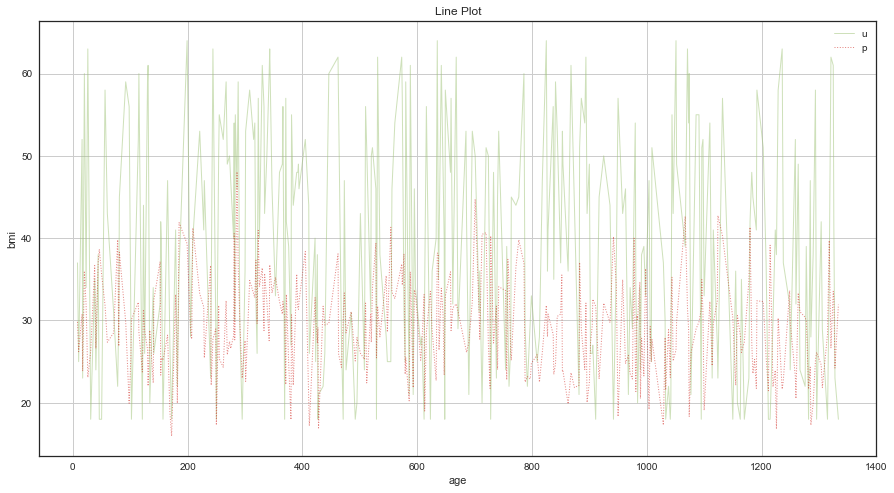

In [130]:
dados.age.plot(kind='line', color='g', label='Age', linewidth=1, alpha=0.5, grid=True, linestyle='-')
dados.bmi.plot(kind='line', color='r', label='BMI', linewidth=1, alpha=0.5, grid=True, linestyle=':')
plt.legend('upper left')
plt.xlabel('age')
plt.ylabel('bmi')
plt.title('Line Plot')
plt.show();

---

## Considerações Finais

## Veja que o conjunto de dados utilizado nessa análise é um dos clássicos da literatura. Não é um conjunto de dados que poderíamos dizer que representa dados da realidade, pois já estão muito bem resumidos e pré-processados. Esses conjuntos de dados são menos interessantes para se utilizar em projetos de portfólio do que dados que venham de uma fonte mais representativa da realidade.


## No entanto, uma maneira de tornar o uso de tais conjuntos é tentar colocar uma nova ótica, uma nova abordagem, uma nova maneira de enxergar o problema. É o que nós fizemos ao colocar a atenção da modelagem numa das variáveis que a principio era preditora do problema tradicionalmente abordado, contextualizando com um possível problema de negócio.¶


## Isso demonstra sua capacidade de ir além, de explorar novos caminhos, de ser diferente dos demais. É isso que muitos recrutadores estão procurando, então, não perca as chances de demonstrar suas habilidades, em qualquer contexto de aplicação que seja.¶


---

## FIM